# ***Auslegung C120 Longitudinal Control***

### Änderungshistorie

- V0 Ersterstellung
- V1 Lastprofil angepasst, Asugabe Borg Warner Batterie
- V2 Getriebeübersetzung und v_max
- V3 Getriebeübersetzung und v_max
- V4 Verzögerung elektrisch geändert und v_max
- V5 Getriebeübersetzung an Bonfiglioli Getriebe angepasst, Batterie Ampherr, Anzahl Antriebe
- V6 Bosch Getriebe
- V7 Dana Getriebe, Kräfte Streben
- V8 Bonfi Zwitter Getriebe, volle Rekuperation
- V9 Gesamtgewicht erhöht mit Tempobegrenzung
- V10 Fehler Berechnung Bremse behoben (verzögerung bei Bremsweg als positiven Wert)
- V11 Adaptierung Bremsszenarien ohne Reaktionszeit
- V12 reduzierung Gewicht, Proventia Batterie, Anzahl Batterie anhand Beschleunigung anstatt Anfahren

## *0 Allgemein*

### 0.1 Bibliotheken


In [291]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import csv
import os
import pandas as pd

### 0.2 Funktionen

In [292]:
#return Variable als Dict
def return_var_dict(formelzeichen, ganzname, wert, einheit):
    return {
        "formelzeichen": formelzeichen,
        "ganzname": ganzname,
        "wert": wert,
        "einheit": einheit
    }

#Berechnung Fahrwiderstand
def get_F_res(m, C_f, slp, a):              
    g = 9.81
    #Rollwiderstand
    F_f = m * g * C_f                       
    # Steigungs- oder Gefällewiderstand
    F_st = m * g * (slp / 100)      
    # Beschleunigungswiderstand        
    F_b = m * a     
    # resultierender Widerstand  
    F_res = F_f + F_st + F_b
    return return_var_dict("F_res", "Fahrwiderstand", F_res, "N")

#Berechnung der beötigten Zeit
def get_t(v,a):
    if a == 0:
        t = 0
    else:
        t = np.abs(v / a)
    return return_var_dict("t", "Zeit", t, "s")


#Berechnung Drehmoment am Rad
def get_M_rad(F_res, r, n_antrieb,): 
    M_rad = (F_res * r) / n_antrieb                 
    return return_var_dict("M_rad", "Drehmoment am Rad", M_rad, "Nm")

#Ausgabe Ergebnis
def print_res(res):                         
    print(f"{res['ganzname']} = {res['wert']:.02f} {res['einheit']}")

def get_v(v_min, v_max, slp, slp_max):
    # Steigung/Gefälle in [0, steigung_max] skalieren
    faktor = min(abs(slp), slp_max) / slp_max

    # Lineare Interpolation zwischen v_max (bei 0 %) und v_min (bei max Steigung/Gefälle)
    v = v_max - (v_max - v_min) * faktor
    return return_var_dict("v","Geschwindigkeit", v, "m/s^2")

#Berechung Steigung Bogenmaß
def get_slp_rad(slp):
    slp_rad = np.arctan(slp/100)
    return return_var_dict("slp_rad", "Steigung Bogenmaß", slp_rad, "rad")

#Berechnung Steigung in Grad
def get_slp_deg(slp):
    slp_deg = np.degrees(np.arctan(slp/100))
    return return_var_dict("slp_deg", "Steigung Grad", slp_deg, "°")

#Berechnung Beschleunigung
def get_a_slp(slp, slp_max,a_beschl_max,a_beschl_min,):
    if slp > 0:
        fkt = min(slp/slp_max, 1)
        a_slp = a_beschl_max -fkt* (a_beschl_max - a_beschl_min)
    else:
        a_slp = a_beschl_max
    return return_var_dict("a_slp", "Beschleunigung Steigung", a_slp, "m/s²")

#Berechnung Drehzahl Rad
def get_n_rad(v, r):
    n_rad = (v * 1000) / (2 * np.pi * r)
    return return_var_dict("n_rad", "Drehzahl Rad", n_rad, "1/min")

#Berechnung Drehzahl Motor
def get_n_mot(n_rad,i_get):
    n_mot = (n_rad*i_get)
    return return_var_dict("n_mot", "Drehzahl Motor", n_mot, "1/min")

# Berechnung Schwerpunkt
def get_sp(m,x,y,z):
    mx = m * x
    my = m * y
    mz = m * z
    return (mx, my, mz)  

#Berechnung Resulierende Kraft am Rad
def get_F_res_xy(F_x,F_y):
    F_res = np.sqrt(F_x**2+F_y**2)
    return return_var_dict("F_res", "Resulierende Kraft am Rad", F_res, "N")

#Berechnung Drehzahl Rad
def get_n_rad(v, r):
    n_rad = (v * 60) / (2 * np.pi * r)
    return return_var_dict("n_rad", "Drehzahl Rad", n_rad, "1/min")

#Berechne den Reibungskoeffizienten
def get_mu(F_res_x, F_res_y, F_n,n_ant,n_bremsen, n_bremsen_def,n_raeder):
    if F_n ["wert"] < 0:
        mu = np.absolute((F_res_x["wert"]/n_bremsen-n_bremsen_def)/(F_n["wert"]/n_raeder))
    else:
        mu = np.absolute((F_res_x["wert"]/n_ant)/(F_n["wert"])/n_raeder)
    return return_var_dict("mu", "Reibungskoeffizient", mu, "oE")

#Berechnung des Motor Drehmoments
def get_M_mot(M_rad, i_get, eta_get):
    M_mot = (M_rad ["wert"] / i_get) / eta_get
    return return_var_dict("M_mot", "Drehmoment Motor", M_mot, "Nm")

#Berechunug der elektrischen Leistung Motor
def get_P_el(M_mot, n_mot, eta_mot):
    if M_mot["wert"] < 0:
        P_el = ((M_mot["wert"] * (n_mot["wert"]*2*np.pi/60)/1000)*eta_mot)
    else:
        P_el = ((M_mot["wert"] * (n_mot["wert"]*2*np.pi/60)/1000)/eta_mot)
    return return_var_dict("P_el", "Elektrische Leistung Motor", P_el, "kW")

#Berechnung des Stroms aus der Batterie
def get_I_bat(P_el,eta_inv, U_bat, n_ant):
    I_bat = ((P_el["wert"]*1000)/(eta_inv*U_bat))* n_ant
    return return_var_dict("I_bat", "Strom Antriebe aus der Batterie", I_bat, "A")

#Berechnung der Energie Batterie pro Motor
def get_E_bat(I_bat,U_bat_nom, t):
    E_bat = ((I_bat["wert"]*U_bat_nom*t["wert"])/3600)/1000
    return return_var_dict("E_bat", "Energie Batterie", E_bat, "kWh")


## *1 Variablen*

### 1.1 Fahrzeug

#### 1.1.1 Allgemein

In [293]:
m_fzg = 7500                           #kg
m_cab = 1750                            #kg
m_src = 250                             #kg
x_achsabstand = 9.5                     #m Anhand Q-2428-0000310-A
x_achsabstand_achspaar = 0            #m
n_ant = 4                               #oE
n_bremsen = 4                           #oE
n_raeder = 4                            #oE

#### 1.1.2 Schwerpunkte

In [294]:
sp_fzg_x = 0                #m
sp_fzg_y = 0                    #m
sp_fzg_z = 0                #m

sp_cab_x = 0                #m
sp_cab_y = 0                    #m
sp_cab_z = 0                #m

sp_src_x = 0                  #m
sp_src_y = 0                    #m
sp_src_z = 0                #m

#### 1.1.3 Beschleunigung / Geschwindigkeit

In [295]:
v_max = 5.55                    #m/s
v_min = 1.39                    #m/s
a_beschl_max = 0.4              #m/s^2
a_beschl_min = 0.1              #m/s^2
a_verz = -1.962                 #m/s^2  
a_verz_motor = a_verz             #m/s^2

#### 1.1.4 Reifen

In [296]:
#Continental RT20 315/70 R15
r_rad_unbel = 0.410              #m
def_rad = 0.035                  #m

#### 1.1.5 Getriebe

In [297]:
#Getriebe
#Bonfi Zwittergetriebe
i_get = 37.3              #oE         Übersetzungsverhätnis
eta_get = 0.94              #oE         Wirkungsgrad

#### 1.1.6 Motor

In [298]:
#xxx
k_t = 0                      #Nm/A
k_EMK = 0                   #V_RMS/1000rpm
R_LL = 0                    #Ohm
eta_mot = 0.85
M_RB_max = 0                 #Nm Annahme
k_i_anl = 5                     #Faktor Anlaufstrom zu Nennstrom

#### 1.1.7 Inverter

In [299]:
#Inverter
eta_inv = 0.95

#### 1.1.8 Batterie

In [300]:
#Batterie 2x proventia 8m in Serie (String)
n_bat = 1               #Stk.       Anzahl Strings
eta_bat = 0.98          #oE         Wirkungsgrad Batterie
E_bat_br = 62700        #Wh         Brutto string
U_bat_nom = 614       #V         #Aus Datenblatt 
U_bat_min = 610       #V          # OSV-String Datenblatt 80% DOD
U_bat_max = 640       #V  	        # OSV-String Datenblatt 80% DOD
m_bat = 700             #kg          
I_bat_dc_cont = 200      #A          Annahme Strom kontinuierlich Entladen
I_bat_dc_peak = 306     #A          Annahme Strom spitze Entladen 30s
I_bat_c_cont = 100      #A          Annahme Strom kontinuierlich Laden
I_bat_c_peak = 306      #A          Annahme Strom spitze Entladen 30s
K_bat_kwH = 450         #EUR/kWh    Ableitung von Ampherr  inkl. Angstfaktor

#### 1.1.9 elektrisches Laden

In [301]:
#elektrisches Laden
P_laden_DC = 75         #kW         Leistung DC Laden       Aussage Lukas 20250610
P_laden_AC = 44         #kW         Lesitung AC Laden       Aussage Lukas 20250610



#### 1.1.10 Lenkung

In [302]:
#Lenkung
r_kurve = 18        #m      Kurvenradius Annahme

#### 1.1.11 Achse

In [303]:
l_a = 0.18      #m  Länge a
l_b = 0.2       #m  Länge b
l_c = 0.2       #m  Länge c

alpha = 0       #°  Auslenkung in z obere Zugstrebe
beta = 0        #°  Auslenkung in z untere Zugstrebe
gamma = 17.9    #°  Auslenkung in y Strebe

### 1.2 Projekt

In [304]:
#Planet
g = 9.81                    #m/s^2

#Baustelle
C_f_tr = 0.3        #Haftreibungskoeffizient
C_f_r = 0.02        #Rollreibungskoeffizient
C_f_a = 0.05       #Rollreibungskoeffizient Anfahren

slp_max = 10                     #%  maximale Längssteigung
cr_slp_max = 3             #%  maximale Quersteigung

F_stör_x = 4000              #N
F_stör_y = 1000              #N

r_tun_sf = 2        #m      #Tunnelradius

#Nutzlast
#Annahme
m_ntzl1 = 11100           #kg
m_ntzl2 = 0           #kg
m_ntzl3 = 0           #kg

#3 Stk. Tübing
sp_ntzl1_x = 0        #m
sp_ntzl1_y = 0            #m
sp_ntzl1_z = 0        #m

#3 Stk. Tübing
sp_ntzl2_x = 0        #m
sp_ntzl2_y = 0            #m
sp_ntzl2_z = 0        #m

#3 Stk. Tübing
sp_ntzl3_x = 0      #m
sp_ntzl3_y = 0            #m
sp_ntzl3_z = 0        #m

#Fahrprofil
fahrprofil_voll_voll= {
    "l_sek" : [2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000],
    "slp_sek" : [0,2,4,6,8,10,-10,-8,-6,-4,-2,0,0,2,4,6,8,10,-10,-8,-6,-4,-2,0],
    "load_sek": [1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1],
}

fahrprofil_voll_leer= {
    "l_sek" : [2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000],
    "slp_sek" : [0,2,4,6,8,10,-10,-8,-6,-4,-2,0,0,2,4,6,8,10,-10,-8,-6,-4,-2,0],
    "load_sek": [1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0],
}

#Nebenaggregate, Aussage Lukas 20250929
p_hyd = 4.5           #kW       

p_24V_asv = 1.3         #kW       
p_24V_src = 0.5         #kW
p_24V_cab = 2.4         #kW
p_24V_cab_tms = 2.75    #kW

p_cool_motor = 0.541          #kW 	  
p_cool_inv = 0.541            #kW
p_cool_dcdc_obc = 0.541       #kW
p_cool_bat_drive_lv = 3.125   #kW
p_cool_bat_charge_hv = 6       #kW     

print(len(fahrprofil_voll_voll["l_sek"]))
print(len(fahrprofil_voll_voll["slp_sek"]))
print(len(fahrprofil_voll_voll["load_sek"]))

24
24
24


## *2 Berechungen*

### 2.0 Gewicht

In [305]:
# Masse Nutzlast
m_ntzl_ges = return_var_dict(
    "m_ntzl_ges", 
    "Masse Nutzlast gesamt", 
    m_ntzl1 + m_ntzl2 + m_ntzl3, 
    "kg"
)

#Masse Gesamt beladen
m_ges_bel = return_var_dict(
    "m_ges_bel",
    "Masse Gesamt beladen",
    m_fzg + m_cab + m_src + m_ntzl_ges["wert"],
    "kg"
)

# Masse Gesamt unbeladen
m_ges_unb = return_var_dict(
    "m_ges_unb",
    "Masse Gesamt unbeladen",
    m_fzg + m_cab + m_src,
    "kg"
)


print_res(m_ges_unb)
print_res(m_ntzl_ges)
print_res(m_ges_bel)

Masse Gesamt unbeladen = 9500.00 kg
Masse Nutzlast gesamt = 11100.00 kg
Masse Gesamt beladen = 20600.00 kg


### 2.1 Normalkraft

In [306]:
# Normalkraft unbeladen
F_n_unb = return_var_dict(
    "F_n_unb",
    "Normalkraft unbeladen",
    m_ges_unb["wert"] * g,
    "N"
)

# Normalkraft beladen
F_n_bel = return_var_dict(
    "F_n_bel",
    "Normalkraft beladen",
    m_ges_bel["wert"] * g,
    "N"
)

print_res(F_n_unb)
print_res(F_n_bel)

Normalkraft unbeladen = 93195.00 N
Normalkraft beladen = 202086.00 N


### 2.2 Steigung

In [307]:
#Winkel Steigung
slp_max_rad = get_slp_rad(slp_max)    
slp_max_deg = get_slp_deg(slp_max)

#Winkel Quersteigung
crslp_max_rad = get_slp_rad(cr_slp_max)
crslp_max_deg = get_slp_deg(cr_slp_max)

#Ausgabe
print_res(slp_max_rad)
print_res(slp_max_deg)
print_res(crslp_max_rad)
print_res(crslp_max_deg)

Steigung Bogenmaß = 0.10 rad
Steigung Grad = 5.71 °
Steigung Bogenmaß = 0.03 rad
Steigung Grad = 1.72 °


### 2.3 Geschwindigkeit

In [308]:
#Winkelgeschwindigkeit
r_rad_bel = return_var_dict(
    "r_rad_bel",
    "Radradius beladen",
    r_rad_unbel - def_rad,
    "m"
)

omega_rad = return_var_dict(
    "omega_rad",
    "Winkelgeschwindigkeit Rad",
    v_max / r_rad_bel["wert"],
    "rad/s"
)

#Winkelgeschwindigkeit Motor
omega_mot = return_var_dict(
    "omega_mot",
    "Winkelgeschwindigkeit Motor",
    omega_rad["wert"] * i_get,
    "rad/s"
)

print_res(r_rad_bel)
print_res(omega_rad)
print_res(omega_mot)


Radradius beladen = 0.38 m
Winkelgeschwindigkeit Rad = 14.80 rad/s
Winkelgeschwindigkeit Motor = 552.04 rad/s


### 2.5 Fahrwiderstände

In [309]:
#Fahrwiderstände 
F_rw_bel = m_ges_bel["wert"]*C_f_r*g
F_rw_unb = m_ges_unb["wert"]*C_f_r*g

F_af_bel = m_ges_bel["wert"]*C_f_a*g
F_af_unb = m_ges_unb["wert"]*C_f_a*g

F_ha_unb = (m_ges_unb["wert"]*g*np.sin(slp_max_rad["wert"]))
F_ha_bel = (m_ges_bel["wert"]*g*np.sin(slp_max_rad["wert"]))

F_bs_unb = m_ges_unb["wert"]*a_beschl_max
F_bs_bel = m_ges_bel["wert"]*a_beschl_max

F_vz_unb = m_ges_unb["wert"]*a_verz
F_vz_bel = m_ges_bel["wert"]*a_verz

#Ausgabe
print(f"Rollwiderstand unbeladen = {F_rw_unb:.0f}N")
print(f"Rollwiderstand beladen= {F_rw_bel:.0f}N")
print()
print(f"Anfahrwiderstand unbeladen = {F_af_unb:.0f}N")
print(f"Anfahrwiderstand beladen= {F_af_bel:.0f}N")
print()
print(f"Steigungswiderstand unbeladen = {F_ha_unb:.0f}N")
print(f"Steigungswiderstand beladen= {F_ha_bel:.0f}N")
print()
print(f"Beschleunigungswiderstand unbeladen = {F_bs_unb:.0f}N")
print(f"Beschleunigungswiderstand beladen= {F_bs_bel:.0f}N")
print()
print(f"Verzögerungswiderstand unbeladen = {F_vz_unb:.0f}N")
print(f"Verzögerungswiderstand beladen = {F_vz_bel:.0f}N")
print()

Rollwiderstand unbeladen = 1864N
Rollwiderstand beladen= 4042N

Anfahrwiderstand unbeladen = 4660N
Anfahrwiderstand beladen= 10104N

Steigungswiderstand unbeladen = 9273N
Steigungswiderstand beladen= 20108N

Beschleunigungswiderstand unbeladen = 3800N
Beschleunigungswiderstand beladen= 8240N

Verzögerungswiderstand unbeladen = -18639N
Verzögerungswiderstand beladen = -40417N



### 2.6 Querkräfte

In [310]:
#Zentripetalkraft bei v max
F_zp_unb = m_ges_unb["wert"]*((v_max**2)/r_kurve)
F_zp_bel = m_ges_bel["wert"]*((v_max**2)/r_kurve)

#Kraft Quersteigung
F_qs_unb = (m_ges_unb["wert"]*g*np.sin(crslp_max_rad["wert"]))
F_qs_bel = (m_ges_bel["wert"]*g*np.sin(crslp_max_rad["wert"]))



print(f"Zentripetalkraft unbeladen = {F_zp_unb:.0f}N")
print(f"Zentripetalkraft beladen = {F_zp_bel:.0f}N")
print()
print(f"Quersteigungskraft unbeladen = {F_qs_unb:.0f}N")
print(f"Quersteigungskraft beladen = {F_qs_bel:.0f}N")


Zentripetalkraft unbeladen = 16257N
Zentripetalkraft beladen = 35252N

Quersteigungskraft unbeladen = 2795N
Quersteigungskraft beladen = 6060N


### 2.7 Schwerpunkt

In [311]:
'''
def get_sp(m,x,y,z):
    # Berechnung Schwerpunkt
    mx = m * x
    my = m * y
    mz = m * z
    return (mx, my, mz)

# Definition der Einzellisten
list_sp_fzg = [m_fzg, sp_fzg_x, sp_fzg_y, sp_fzg_z]
list_sp_cab = [m_cab, sp_cab_x, sp_cab_y, sp_cab_z]
list_sp_src = [m_src, sp_src_x, sp_src_y, sp_src_z]
list_sp_ntzl1 = [m_ntzl1, sp_ntzl1_x, sp_ntzl1_y, sp_ntzl1_z]
list_sp_ntzl2 = [m_ntzl2, sp_ntzl2_x, sp_ntzl2_y, sp_ntzl2_z]
list_sp_ntzl3 = [m_ntzl3, sp_ntzl3_x, sp_ntzl3_y, sp_ntzl3_z]

# Liste aller Bauteile
list_sp = [
    ("sp_fzg", list_sp_fzg),
    ("sp_cab", list_sp_cab),
    ("sp_src", list_sp_src),
    ("sp_ntzl1", list_sp_ntzl1),
    ("sp_ntzl2", list_sp_ntzl2),
    ("sp_ntzl3", list_sp_ntzl3)
]

# Dictionary zur Speicherung
dict_sp = {}
# Summenvariablen initialisieren
sum_sp_x = 0
sum_sp_y = 0
sum_sp_z = 0

for name, part in list_sp:
    sp = schwerpunkt(part)
    dict_sp[name] = sp
    sum_sp_x += sp[0]
    sum_sp_y += sp[1]
    sum_sp_z += sp[2]

# Ausgabe der Einzelergebnisse
print("Einzelschwerpunkte:", dict_sp)

# Ausgabe der Summe
print("Summe Schwerpunktwerte (sp_x, sp_y, sp_z):", (sum_sp_x, sum_sp_y, sum_sp_z))
'''

'\ndef get_sp(m,x,y,z):\n    # Berechnung Schwerpunkt\n    mx = m * x\n    my = m * y\n    mz = m * z\n    return (mx, my, mz)\n\n# Definition der Einzellisten\nlist_sp_fzg = [m_fzg, sp_fzg_x, sp_fzg_y, sp_fzg_z]\nlist_sp_cab = [m_cab, sp_cab_x, sp_cab_y, sp_cab_z]\nlist_sp_src = [m_src, sp_src_x, sp_src_y, sp_src_z]\nlist_sp_ntzl1 = [m_ntzl1, sp_ntzl1_x, sp_ntzl1_y, sp_ntzl1_z]\nlist_sp_ntzl2 = [m_ntzl2, sp_ntzl2_x, sp_ntzl2_y, sp_ntzl2_z]\nlist_sp_ntzl3 = [m_ntzl3, sp_ntzl3_x, sp_ntzl3_y, sp_ntzl3_z]\n\n# Liste aller Bauteile\nlist_sp = [\n    ("sp_fzg", list_sp_fzg),\n    ("sp_cab", list_sp_cab),\n    ("sp_src", list_sp_src),\n    ("sp_ntzl1", list_sp_ntzl1),\n    ("sp_ntzl2", list_sp_ntzl2),\n    ("sp_ntzl3", list_sp_ntzl3)\n]\n\n# Dictionary zur Speicherung\ndict_sp = {}\n# Summenvariablen initialisieren\nsum_sp_x = 0\nsum_sp_y = 0\nsum_sp_z = 0\n\nfor name, part in list_sp:\n    sp = schwerpunkt(part)\n    dict_sp[name] = sp\n    sum_sp_x += sp[0]\n    sum_sp_y += sp[1]\n    sum_

### 2.8 Traktion

In [312]:
#Fall 8: Kräfte am Reifen leeres Fahrzeug Anfahren in der Steigung
a_8 = 0.2           #m/s^2      Annahme Beschleunigung in der Steigung
F_bs_8 = m_ges_unb["wert"]*a_8

F_n_8 = F_n_unb["wert"] /n_raeder
F_ant_8 = (F_ha_unb+F_bs_8+F_af_unb)/n_ant
mü_8 = np.absolute(F_ant_8/F_n_8)

print (f"Normalkraft / Rad = {F_n_8:.0f}N")
print (f"Zugkraft / ang. Rad = {F_ant_8:.0f}N")
print (f"Reibkoeffizient = {mü_8:.02f}")

Normalkraft / Rad = 23299N
Zugkraft / ang. Rad = 3958N
Reibkoeffizient = 0.17


In [313]:
#Fall 9: Kräfte am Reifen leeres Fahrzeug Verzögern in der Ebene
F_n_9 = F_n_unb["wert"]/n_raeder
F_bb_9 = (F_rw_unb-F_vz_unb)/n_bremsen
mü_9 = np.absolute(F_bb_9/F_n_9)

print (f"Normalkraft / Rad = {F_n_9:.0f}N")
print (f"Zugkraft / ang. Rad = {F_bb_9:.0f}N")
print (f"Reibkoeffizient = {mü_9:.02f}")

Normalkraft / Rad = 23299N
Zugkraft / ang. Rad = 5126N
Reibkoeffizient = 0.22


In [314]:
#Fall 10: Kräfte am Reifen leeres Fahrzeug Verzögern, Lenken und Störkräfte in der Ebene
F_n_10 = F_n_unb["wert"]/n_raeder
F_x_10 = (F_rw_unb+F_stör_x-F_vz_unb)/n_bremsen
F_y_10 = (F_zp_unb + F_qs_unb + F_stör_y)/n_raeder
F_r_10 = np.sqrt(F_x_10**2+F_y_10**2)
mü_10 = np.absolute(F_r_10/F_n_10)

print (f"Normalkraft / Rad = {F_n_10:.0f}N")
print(f"Kraft in X = {F_x_10:.0f}N")
print(f"Kraft in Y = {F_y_10:.0f}N")
print (f"resultierende Kraft / Rad = {F_r_10:.0f}N")
print (f"Reibkoeffizient = {mü_10:.02f}")

Normalkraft / Rad = 23299N
Kraft in X = 6126N
Kraft in Y = 5013N
resultierende Kraft / Rad = 7915N
Reibkoeffizient = 0.34


In [315]:
#Fall 12: Kräfte am Reifen leeres Fahrzeug Beschleunigen, Lenken und Störkräfte in der Ebene
F_n_12 = F_n_unb["wert"]/n_raeder
F_x_ant_12 = F_bs_unb/n_ant
F_x_12 = (F_rw_unb+F_stör_x)/n_raeder+F_x_ant_12
F_y_12 = (F_zp_unb + F_qs_unb + F_stör_y)/n_raeder
F_r_12 = np.sqrt(F_x_12**2+F_y_12**2)
mü_12 = np.absolute(F_r_12/F_n_12)

print (f"Normalkraft / Rad = {F_n_12:.0f}N")
print(f"Kraft in X = {F_x_12:.0f}N")
print(f"Kraft in Y = {F_y_12:.0f}N")
print (f"resultierende Kraft / Rad = {F_r_12:.0f}N")
print (f"Reibkoeffizient = {mü_12:.02f}")

Normalkraft / Rad = 23299N
Kraft in X = 2416N
Kraft in Y = 5013N
resultierende Kraft / Rad = 5565N
Reibkoeffizient = 0.24


### 2.9 Antrieb

#### 2.9.1 Antrieb voll-voll

In [316]:
# Initialisiere eine Liste, um die Ergebnisse zu speichern
results_1 = []
E_bat_kum = return_var_dict("E_bat_kum", "Energie Batterie kumuliert", 0, "kWh")
t_kum = return_var_dict("t_kum", "Zeit kumuliert", 0, "s")
s_kum = return_var_dict("s_kum", "Länge kumuliert",0 ,"m")

# Berechnung der Sektoren
for idx, sek in enumerate(fahrprofil_voll_voll["l_sek"]):
    if idx >= len(fahrprofil_voll_voll["slp_sek"]):
        break  # Beende die Schleife, wenn keine Steigung mehr vorhanden ist
    slp = fahrprofil_voll_voll["slp_sek"][idx]
    
    #Berechnung der Beschleunigung in der Steigung
    a_slp = get_a_slp(slp, slp_max, a_beschl_max, a_beschl_min)["wert"]

    #Berechnung der Verzögerung
    verz = a_verz_motor

    #Berechung der kumulierten Länge
    s_kum["wert"] = s_kum["wert"] + fahrprofil_voll_voll["l_sek"][idx]

    # Berechnung der resultierenden Kräfte
    if fahrprofil_voll_voll["load_sek"][idx] == 0:
        m_ges = return_var_dict("Masse_gesamt", "m_ges",m_ges_unb["wert"], "kg")
    else:
        m_ges = return_var_dict("Masse_gesamt", "m_ges",m_ges_bel["wert"], "kg")
    F_res_anf = get_F_res(m_ges["wert"], C_f_a, slp, a_slp)
    F_res_beschl = get_F_res(m_ges["wert"], C_f_r, slp, a_slp)
    F_res_steady = get_F_res(m_ges["wert"], C_f_r, slp, 0)
    F_res_verz = get_F_res(m_ges["wert"], C_f_r, slp, verz)
    
    # Berechnung der Raddrehmomente
    M_rad_anf = get_M_rad(F_res_anf["wert"], r_rad_bel["wert"], n_ant)
    M_rad_beschl = get_M_rad(F_res_beschl["wert"], r_rad_bel["wert"],n_ant)
    M_rad_steady = get_M_rad(F_res_steady["wert"], r_rad_bel["wert"],n_ant)
    M_rad_verz = get_M_rad(F_res_verz["wert"], r_rad_bel["wert"],n_ant)

    # Berechnung der Geschwindigkeit
    v = get_v(v_min,v_max,slp,slp_max)

    #Berechnung der Zeit
    t_anf = return_var_dict("Zeit anfahren", "t_anf", 0.5 , "s") #Annahme zur Vereinfachung
    t_beschl = get_t(v["wert"], a_slp)
    t_verz = get_t(v["wert"], verz)
    t_kont = (fahrprofil_voll_voll["l_sek"][idx] / v["wert"]) - t_anf["wert"] - t_verz["wert"]
    t_kont = return_var_dict("Zeit", "t", t_kont, "s")
    t_kum["wert"] = t_kum["wert"] + t_kont["wert"] + t_beschl["wert"] + t_verz["wert"] + t_anf["wert"]

    # Berechnung der Geschwindigkeit am Rad
    n_rad = get_n_rad(v["wert"], r_rad_bel["wert"])

    # Berechnung der Drehmomente am Motor
    M_mot_anf = get_M_mot(M_rad_anf, i_get, eta_get)
    M_mot_beschl = get_M_mot(M_rad_beschl, i_get, eta_get)
    M_mot_steady = get_M_mot(M_rad_steady, i_get, eta_get)
    M_mot_verz = get_M_mot(M_rad_verz, i_get, eta_get)

    #Berechnung der Geschwindigkeit am Motor
    n_mot = get_n_mot(n_rad["wert"],i_get)

    #Berechnung der Motorleistung
    P_el_beschl = get_P_el(M_mot_beschl, n_mot, eta_mot)
    P_el_steady = get_P_el(M_mot_steady, n_mot, eta_mot)
    P_el_verz = get_P_el(M_mot_verz, n_mot, eta_mot)

    #Berechne Strom pro Motor aus der Batterie
    #Ströme beim Anfahren sind höher
    I_bat_anf_min = get_I_bat(P_el_steady, eta_inv, U_bat_min, n_ant)
    I_bat_anf_min["wert"] = I_bat_anf_min["wert"] * k_i_anl
    I_bat_anf_max = get_I_bat(P_el_steady, eta_inv, U_bat_max, n_ant)
    I_bat_anf_max["wert"] = I_bat_anf_max["wert"] * k_i_anl
    #Ströme in der Bewegung sind niedriger
    I_bat_beschl_min = get_I_bat(P_el_beschl, eta_inv, U_bat_min, n_ant)
    I_bat_beschl_max = get_I_bat(P_el_beschl, eta_inv, U_bat_max, n_ant)
    I_bat_steady_min = get_I_bat(P_el_steady, eta_inv, U_bat_min, n_ant)
    I_bat_steady_max = get_I_bat(P_el_steady, eta_inv, U_bat_max, n_ant)
    I_bat_verz_min = get_I_bat(P_el_verz, eta_inv, U_bat_min, n_ant)
    I_bat_verz_max = get_I_bat(P_el_verz, eta_inv, U_bat_max, n_ant)

    #Berechnung der Energie Batterie für Antrieb
    #Das Anfahren ist nicht berücksichtigt. Nur die Beschleunigung, Kontinuierlich und Verzögerung in jedem Sektor
    E_bat = return_var_dict("Energie Batterie", "E_bat", get_E_bat(I_bat_beschl_max, U_bat_nom, t_beschl)["wert"] + get_E_bat(I_bat_steady_max, U_bat_nom, t_kont)["wert"] + get_E_bat(I_bat_verz_max, U_bat_nom, t_verz)["wert"], "kWh")
    E_bat_kum["wert"] = np.abs(E_bat["wert"]) + E_bat_kum["wert"]
    
    # Speichere die Ergebnisse in der Liste
    results_1.append({
        "Sektor": idx,
        "Länge (m)": sek,
        f"{s_kum['ganzname']} ({s_kum['einheit']})": s_kum["wert"],
        "Steigung (%)": slp,
        "Beschleunigung (m/s²)": a_slp,
        "Verzögerung (m/s²)": verz,
        f"{m_ges['ganzname']} ({m_ges['einheit']})": m_ges["wert"],
        f"{F_res_anf['ganzname']} Anfahren ({F_res_anf['einheit']})": F_res_anf["wert"],
        f"{F_res_beschl['ganzname']} Beschleunigen ({F_res_beschl['einheit']})": F_res_beschl["wert"],
        f"{F_res_steady['ganzname']} Kontinuierlich ({F_res_steady['einheit']})": F_res_steady["wert"],
        f"{F_res_verz['ganzname']} Verzögern ({F_res_verz['einheit']})": F_res_verz["wert"],
        f"{M_rad_anf['ganzname']} Anfahren ({M_rad_anf['einheit']})": M_rad_anf["wert"],
        f"{M_rad_beschl['ganzname']} Beschleunigen({M_rad_beschl['einheit']})": M_rad_beschl["wert"],
        f"{M_rad_steady['ganzname']} Kontinuierlich ({M_rad_steady['einheit']})": M_rad_steady["wert"],
        f"{M_rad_verz['ganzname']} Verzögern ({M_rad_verz['einheit']})": M_rad_verz["wert"],
        f"{v['ganzname']} ({v['einheit']})": v["wert"],
        f"{n_rad['ganzname']} ({n_rad['einheit']})": n_rad["wert"],
        f"{t_anf['ganzname']} Anfahren ({t_anf['einheit']})": t_anf["wert"],
        f"{t_beschl['ganzname']} Beschleunigen ({t_beschl['einheit']})": t_beschl["wert"],
        f"{t_kont['ganzname']} Kontinuierlich ({t_kont['einheit']})": t_kont["wert"],
        f"{t_verz['ganzname']} Verzögern ({t_verz['einheit']})": t_verz["wert"],
        f"{t_kum['ganzname']} ({t_kum['einheit']})": t_kum["wert"],
        f"{M_mot_anf['ganzname']} Anfahren ({M_mot_anf['einheit']})": M_mot_anf["wert"],
        f"{M_mot_beschl['ganzname']} Beschleunigen ({M_mot_beschl['einheit']})": M_mot_beschl["wert"],
        f"{M_mot_steady['ganzname']} Kontinuierlich ({M_mot_steady['einheit']})": M_mot_steady["wert"],
        f"{M_mot_verz['ganzname']} Verzögern ({M_mot_verz['einheit']})": M_mot_verz["wert"],
        f"{n_mot['ganzname']} ({n_mot['einheit']})": n_mot["wert"],
        f"{P_el_beschl['ganzname']} Beschleunigen ({P_el_beschl['einheit']})": P_el_beschl["wert"],
        f"{P_el_steady['ganzname']} Kontinuierlich ({P_el_steady['einheit']})": P_el_steady["wert"],
        f"{P_el_verz['ganzname']} Verzögern ({P_el_verz['einheit']})": P_el_verz["wert"],
        f"{I_bat_anf_min['ganzname']} Anfahren min ({I_bat_anf_min['einheit']})": I_bat_anf_min["wert"],
        f"{I_bat_anf_max['ganzname']} Anfahren max ({I_bat_anf_max['einheit']})": I_bat_anf_max["wert"],
        f"{I_bat_beschl_min['ganzname']} Beschleunigen min ({I_bat_beschl_min['einheit']})": I_bat_beschl_min["wert"],
        f"{I_bat_beschl_max['ganzname']} Beschleunigen max ({I_bat_beschl_max['einheit']})": I_bat_beschl_max["wert"],
        f"{I_bat_steady_min['ganzname']} Kontinuierlich min ({I_bat_steady_min['einheit']})": I_bat_steady_min["wert"],
        f"{I_bat_steady_max['ganzname']} Kontinuierlich max ({I_bat_steady_max['einheit']})": I_bat_steady_max["wert"],
        f"{I_bat_verz_min['ganzname']} Verzögern min ({I_bat_verz_min['einheit']})": I_bat_verz_min["wert"],
        f"{I_bat_verz_max['ganzname']} Verzögern max ({I_bat_verz_max['einheit']})": I_bat_verz_max["wert"],
        f"{E_bat['ganzname']} ({E_bat['einheit']})": E_bat["wert"],
        f"{E_bat_kum['ganzname']} ({E_bat_kum['einheit']})": E_bat_kum["wert"],
    })

# Erstelle einen DataFrame aus den Ergebnissen
df_Lastkollektiv_Antrieb_voll_voll = pd.DataFrame(results_1)


#### 2.9.2 Antrieb voll-leer

In [317]:
# Initialisiere eine Liste, um die Ergebnisse zu speichern
results_2 = []
E_bat_kum = return_var_dict("E_bat_kum", "Energie Batterie kumuliert", 0, "kWh")
t_kum = return_var_dict("t_kum", "Zeit kumuliert", 0, "s")
s_kum = return_var_dict("s_kum", "Länge kumuliert",0 ,"m")

# Berechnung der Sektoren
for idx, sek in enumerate(fahrprofil_voll_leer["l_sek"]):
    if idx >= len(fahrprofil_voll_leer["slp_sek"]):
        break  # Beende die Schleife, wenn keine Steigung mehr vorhanden ist
    slp = fahrprofil_voll_leer["slp_sek"][idx]
    
    #Berechnung der Beschleunigung in der Steigung
    a_slp = get_a_slp(slp, slp_max, a_beschl_max, a_beschl_min)["wert"]

    #Berechnung der Verzögerung
    verz = a_verz_motor

    #Berechung der kumulierten Länge
    s_kum["wert"] = s_kum["wert"] + fahrprofil_voll_voll["l_sek"][idx]

    # Berechnung der resultierenden Kräfte
    if fahrprofil_voll_leer["load_sek"][idx] == 0:
        m_ges = return_var_dict("Masse_gesamt", "m_ges",m_ges_unb["wert"], "kg")
    else:
        m_ges = return_var_dict("Masse_gesamt", "m_ges",m_ges_bel["wert"], "kg")
    F_res_anf = get_F_res(m_ges["wert"], C_f_a, slp, a_slp)
    F_res_beschl = get_F_res(m_ges["wert"], C_f_r, slp, a_slp)
    F_res_steady = get_F_res(m_ges["wert"], C_f_r, slp, 0)
    F_res_verz = get_F_res(m_ges["wert"], C_f_r, slp, verz)
    
    # Berechnung der Raddrehmomente
    M_rad_anf = get_M_rad(F_res_anf["wert"], r_rad_bel["wert"], n_ant)
    M_rad_beschl = get_M_rad(F_res_beschl["wert"], r_rad_bel["wert"],n_ant)
    M_rad_steady = get_M_rad(F_res_steady["wert"], r_rad_bel["wert"],n_ant)
    M_rad_verz = get_M_rad(F_res_verz["wert"], r_rad_bel["wert"],n_ant)

    # Berechnung der Geschwindigkeit
    v = get_v(v_min,v_max,slp,slp_max)

    #Berechnung der Zeit
    t_anf = return_var_dict("Zeit anfahren", "t_anf", 0.5 , "s") #Annahme zur Vereinfachung
    t_beschl = get_t(v["wert"], a_slp)
    t_verz = get_t(v["wert"], verz)
    t_kont = (fahrprofil_voll_voll["l_sek"][idx] / v["wert"]) - t_anf["wert"] - t_verz["wert"]
    t_kont = return_var_dict("Zeit", "t", t_kont, "s")
    t_kum["wert"] = t_kum["wert"] + t_kont["wert"] + t_beschl["wert"] + t_verz["wert"] + t_anf["wert"]

    # Berechnung der Geschwindigkeit am Rad
    n_rad = get_n_rad(v["wert"], r_rad_bel["wert"])

    # Berechnung der Drehmomente am Motor
    M_mot_anf = get_M_mot(M_rad_anf, i_get, eta_get)
    M_mot_beschl = get_M_mot(M_rad_beschl, i_get, eta_get)
    M_mot_steady = get_M_mot(M_rad_steady, i_get, eta_get)
    M_mot_verz = get_M_mot(M_rad_verz, i_get, eta_get)

    #Berechnung der Geschwindigkeit am Motor
    n_mot = get_n_mot(n_rad["wert"],i_get)

    #Berechnung der Motorleistung
    P_el_beschl = get_P_el(M_mot_beschl, n_mot, eta_mot)
    P_el_steady = get_P_el(M_mot_steady, n_mot, eta_mot)
    P_el_verz = get_P_el(M_mot_verz, n_mot, eta_mot)

    #Berechne Strom pro Motor aus der Batterie
    #Sträme beim Anfahren sind höher
    I_bat_anf_min = get_I_bat(P_el_steady, eta_inv, U_bat_min, n_ant)
    I_bat_anf_min["wert"] = I_bat_anf_min["wert"] * k_i_anl
    I_bat_anf_max = get_I_bat(P_el_steady, eta_inv, U_bat_max, n_ant)
    I_bat_anf_max["wert"] = I_bat_anf_max["wert"] * k_i_anl
    #Ströme in der Bewegung sind niedriger
    I_bat_beschl_min = get_I_bat(P_el_beschl, eta_inv, U_bat_min, n_ant)
    I_bat_beschl_max = get_I_bat(P_el_beschl, eta_inv, U_bat_max, n_ant)
    I_bat_steady_min = get_I_bat(P_el_steady, eta_inv, U_bat_min, n_ant)
    I_bat_steady_max = get_I_bat(P_el_steady, eta_inv, U_bat_max, n_ant)
    I_bat_verz_min = get_I_bat(P_el_verz, eta_inv, U_bat_min, n_ant)
    I_bat_verz_max = get_I_bat(P_el_verz, eta_inv, U_bat_max, n_ant)

    #Berechnung der Energie Batterie pro Motor
    #Das Anfahren ist nicht berücksichtigt. Nur die Beschleunigung, Kontinuierlich und Verzögerung in jedem Sektor
    E_bat = return_var_dict("Energie Batterie", "E_bat", get_E_bat(I_bat_beschl_max, U_bat_nom, t_anf)["wert"] + get_E_bat(I_bat_steady_max, U_bat_nom, t_kont)["wert"] + get_E_bat(I_bat_verz_max, U_bat_nom, t_verz)["wert"], "kWh")
    E_bat_kum["wert"] = np.abs(E_bat["wert"]) + E_bat_kum["wert"]
    
    # Speichere die Ergebnisse in der Liste
    results_2.append({
        "Sektor": idx,
        "Länge (m)": sek,
        f"{s_kum['ganzname']} ({s_kum['einheit']})": s_kum["wert"],
        "Steigung (%)": slp,
        "Beschleunigung (m/s²)": a_slp,
        "Verzögerung (m/s²)": verz,
        f"{m_ges['ganzname']} ({m_ges['einheit']})": m_ges["wert"],
        f"{F_res_anf['ganzname']} Anfahren ({F_res_anf['einheit']})": F_res_anf["wert"],
        f"{F_res_beschl['ganzname']} Beschleunigen ({F_res_beschl['einheit']})": F_res_beschl["wert"],
        f"{F_res_steady['ganzname']} Kontinuierlich ({F_res_steady['einheit']})": F_res_steady["wert"],
        f"{F_res_verz['ganzname']} Verzögern ({F_res_verz['einheit']})": F_res_verz["wert"],
        f"{M_rad_anf['ganzname']} Anfahren ({M_rad_anf['einheit']})": M_rad_anf["wert"],
        f"{M_rad_beschl['ganzname']} Beschleunigen({M_rad_beschl['einheit']})": M_rad_beschl["wert"],
        f"{M_rad_steady['ganzname']} Kontinuierlich ({M_rad_steady['einheit']})": M_rad_steady["wert"],
        f"{M_rad_verz['ganzname']} Verzögern ({M_rad_verz['einheit']})": M_rad_verz["wert"],
        f"{v['ganzname']} ({v['einheit']})": v["wert"],
        f"{n_rad['ganzname']} ({n_rad['einheit']})": n_rad["wert"],
        f"{t_anf['ganzname']} Anfahren ({t_anf['einheit']})": t_anf["wert"],
        f"{t_beschl['ganzname']} Beschleunigen ({t_beschl['einheit']})": t_beschl["wert"],
        f"{t_kont['ganzname']} Kontinuierlich ({t_kont['einheit']})": t_kont["wert"],
        f"{t_verz['ganzname']} Verzögern ({t_verz['einheit']})": t_verz["wert"],
        f"{t_kum['ganzname']} ({t_kum['einheit']})": t_kum["wert"],
        f"{M_mot_anf['ganzname']} Anfahren ({M_mot_anf['einheit']})": M_mot_anf["wert"],
        f"{M_mot_beschl['ganzname']} Beschleunigen ({M_mot_beschl['einheit']})": M_mot_beschl["wert"],
        f"{M_mot_steady['ganzname']} Kontinuierlich ({M_mot_steady['einheit']})": M_mot_steady["wert"],
        f"{M_mot_verz['ganzname']} Verzögern ({M_mot_verz['einheit']})": M_mot_verz["wert"],
        f"{n_mot['ganzname']} ({n_mot['einheit']})": n_mot["wert"],
        f"{P_el_beschl['ganzname']} Beschleunigen ({P_el_beschl['einheit']})": P_el_beschl["wert"],
        f"{P_el_steady['ganzname']} Kontinuierlich ({P_el_steady['einheit']})": P_el_steady["wert"],
        f"{P_el_verz['ganzname']} Verzögern ({P_el_verz['einheit']})": P_el_verz["wert"],
        f"{I_bat_anf_min['ganzname']} Anfahren min ({I_bat_anf_min['einheit']})": I_bat_anf_min["wert"],
        f"{I_bat_anf_max['ganzname']} Anfahren max ({I_bat_anf_max['einheit']})": I_bat_anf_max["wert"],
        f"{I_bat_beschl_min['ganzname']} Beschleunigen min ({I_bat_beschl_min['einheit']})": I_bat_beschl_min["wert"],
        f"{I_bat_beschl_max['ganzname']} Beschleunigen max ({I_bat_beschl_max['einheit']})": I_bat_beschl_max["wert"],
        f"{I_bat_steady_min['ganzname']} Kontinuierlich min ({I_bat_steady_min['einheit']})": I_bat_steady_min["wert"],
        f"{I_bat_steady_max['ganzname']} Kontinuierlich max ({I_bat_steady_max['einheit']})": I_bat_steady_max["wert"],
        f"{I_bat_verz_min['ganzname']} Verzögern min ({I_bat_verz_min['einheit']})": I_bat_verz_min["wert"],
        f"{I_bat_verz_max['ganzname']} Verzögern max ({I_bat_verz_max['einheit']})": I_bat_verz_max["wert"],
        f"{E_bat['ganzname']} ({E_bat['einheit']})": E_bat["wert"],
        f"{E_bat_kum['ganzname']} ({E_bat_kum['einheit']})": E_bat_kum["wert"],
    })

# Erstelle einen DataFrame aus den Ergebnissen
df_Lastkollektiv_Antrieb_voll_leer = pd.DataFrame(results_2)



#### 2.9.3 Getriebe spezifisch

In [318]:
# Code zur Generation von Lastkollektiv für Bosch
rows = []
for idx, row in df_Lastkollektiv_Antrieb_voll_voll.iterrows():
    # Anfahren
    rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Anfahren",
        "m_ges": row["m_ges (kg)"],
        "slp": row["Steigung (%)"],
        "m_mot": row["Drehmoment Motor Anfahren (Nm)"],
        "m_rad": row["Drehmoment am Rad Anfahren (Nm)"],
        "n_mot": row["Drehzahl Motor (1/min)"],
        "P_mot": row["Elektrische Leistung Motor Beschleunigen (kW)"],  # oder Anfahren, falls vorhanden
        "n_rad": row["Drehzahl Rad (1/min)"]
    })
    # Beschleunigen
    rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Beschleunigen",
        "m_ges": row["m_ges (kg)"],
        "slp": row["Steigung (%)"],
        "m_mot": row["Drehmoment Motor Beschleunigen (Nm)"],
        "m_rad": row["Drehmoment am Rad Beschleunigen(Nm)"],
        "n_mot": row["Drehzahl Motor (1/min)"],
        "P_mot": row["Elektrische Leistung Motor Beschleunigen (kW)"],
        "n_rad": row["Drehzahl Rad (1/min)"]
    })
    # Kontinuierlich
    rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Kontinuierlich",
        "m_ges": row["m_ges (kg)"],
        "slp": row["Steigung (%)"],
        "m_mot": row["Drehmoment Motor Kontinuierlich (Nm)"],
        "m_rad": row["Drehmoment am Rad Kontinuierlich (Nm)"],
        "n_mot": row["Drehzahl Motor (1/min)"],
        "P_mot": row["Elektrische Leistung Motor Kontinuierlich (kW)"],
        "n_rad": row["Drehzahl Rad (1/min)"]
    })
    # Verzögern
    rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Verzögern",
        "m_ges": row["m_ges (kg)"],
        "slp": row["Steigung (%)"],
        "m_mot": row["Drehmoment Motor Verzögern (Nm)"],
        "m_rad": row["Drehmoment am Rad Verzögern (Nm)"],
        "n_mot": row["Drehzahl Motor (1/min)"],
        "P_mot": row["Elektrische Leistung Motor Verzögern (kW)"],
        "n_rad": row["Drehzahl Rad (1/min)"]
    })

df_Lastkollektiv_Getriebe = pd.DataFrame(rows)

df_Lastkollektiv_Getriebe



,Sektor,Phase,m_ges,slp,m_mot,m_rad,n_mot,P_mot,n_rad
0,0.0,Anfahren,20600.0,0.0,49.049630,1719.778125,5271.593687,21.327768,141.329589
1,0.0,Beschleunigen,20600.0,0.0,32.839292,1151.411250,5271.593687,21.327768,141.329589
2,0.0,Kontinuierlich,20600.0,0.0,10.806892,378.911250,5271.593687,7.018631,141.329589
3,0.0,Verzögern,20600.0,0.0,-97.262029,-3410.201250,5271.593687,-45.638651,141.329589
4,1.0,Anfahren,20600.0,2.0,56.551662,1982.814375,4481.329552,22.272385,120.142883
...,...,...,...,...,...,...,...,...,...
91,22.0,Verzögern,20600.0,-2.0,-108.068921,-3789.112500,4481.329552,-43.107739,120.142883
92,23.0,Anfahren,20600.0,0.0,49.049630,1719.778125,5271.593687,21.327768,141.329589
93,23.0,Beschleunigen,20600.0,0.0,32.839292,1151.411250,5271.593687,21.327768,141.329589
94,23.0,Kontinuierlich,20600.0,0.0,10.806892,378.911250,5271.593687,7.018631,141.329589


#### 2.9.4 Motor spezifisch

In [319]:
# generiere Lastkollektiv für Motorhersteller

rows_motor = []

for idx, row in df_Lastkollektiv_Antrieb_voll_voll.iterrows():
    #Anfahren inkl. Beschleunigen
    rows_motor.append({
        "Phase": "Beschleunigen",
        "Zeit Phase (s)": row["Zeit Beschleunigen (s)"],
        "Drehzahl Start (min^-1)": "0",
        "Drehzahl Ende (min^-1)": row["Drehzahl Motor (1/min)"],
        "Drehmoment Start (Nm)": row["Drehmoment Motor Anfahren (Nm)"],
        "Drehmoment Ende (Nm)" : row["Drehmoment Motor Beschleunigen (Nm)"],
        "Beschleunigung (m/s^2)": row["Beschleunigung (m/s²)"],
    })
    #Kontinuierlich
    rows_motor.append({
        "Phase": "Kontinuierlich",
        "Zeit Phase (s)": row["t Kontinuierlich (s)"],
        "Drehzahl Start (min^-1)": row["Drehzahl Motor (1/min)"],
        "Drehzahl Ende (min^-1)": row["Drehzahl Motor (1/min)"],
        "Drehmoment Start (Nm)": row["Drehmoment Motor Kontinuierlich (Nm)"],
        "Drehmoment Ende (Nm)": row["Drehmoment Motor Kontinuierlich (Nm)"],
        "Beschleunigung (m/s^2)": "0",
    })
    #Verzögern
    rows_motor.append({
        "Phase": "Verzögern",
        "Zeit Phase (s)": row["Zeit Verzögern (s)"],
        "Drehzahl Start (min^-1)": row["Drehzahl Motor (1/min)"],
        "Drehzahl Ende (min^-1)": "0",
        "Drehmoment Start (Nm)": row["Drehmoment Motor Verzögern (Nm)"],
        "Drehmoment Ende (Nm)": "0",
        "Beschleunigung (m/s^2)": -row["Verzögerung (m/s²)"],
    })

# DataFrame erstellen
df_Lastkollektiv_Motor = pd.DataFrame(rows_motor)

# Zeitvektor für alle Phasen aneinanderreihen
zeitpunkte = [0]
drehzahl_vektor = []
drehmoment_vektor = []

for i, row in df_Lastkollektiv_Motor.iterrows():
    t_phase = float(row["Zeit Phase (s)"])
    # Zeitauflösung (z.B. 0.1s)
    if t_phase < 0.1:
        t_res = t_phase
    else:
        t_res = 0.1
    t_vec = np.arange(0, t_phase, t_res)
    if len(t_vec) == 0 or t_vec[-1] != t_phase:
        t_vec = np.append(t_vec, t_phase)
    # Zeitpunkte absolut
    t_abs = zeitpunkte[-1] + t_vec
    zeitpunkte = np.append(zeitpunkte, t_abs[1:])

    # Drehzahl und Drehmoment linear interpolieren
    n_start = float(row["Drehzahl Start (min^-1)"])
    n_ende = float(row["Drehzahl Ende (min^-1)"])
    m_start = float(row["Drehmoment Start (Nm)"])
    m_ende = float(row["Drehmoment Ende (Nm)"])
    n_vec = np.linspace(n_start, n_ende, len(t_vec))
    m_vec = np.linspace(m_start, m_ende, len(t_vec))
    drehzahl_vektor.extend(n_vec)
    drehmoment_vektor.extend(m_vec)

# Zeitpunkte in Minuten umrechnen
zeitpunkte_min = np.array(zeitpunkte) / 60

# Plotten
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=zeitpunkte_min,
    y=drehmoment_vektor,
    mode='lines',
    name='Drehmoment (Nm)',
    yaxis='y1'
))
fig.add_trace(go.Scatter(
    x=zeitpunkte_min,
    y=drehzahl_vektor,
    mode='lines',
    name='Drehzahl (min^-1)',
    yaxis='y2'
))
fig.update_layout(
    title="Drehmoment- und Drehzahlverlauf über Zeit (vektorisiert)",
    xaxis_title="Zeit (min)",
    yaxis=dict(
        title="Drehmoment (Nm)",
        side="left"
    ),
    yaxis2=dict(
        title="Drehzahl (min^-1)",
        overlaying='y',
        side='right'
    ),
    width=900,
    height=500
)
fig.show()


#### 2.9.5 Batterie voll-voll

In [320]:
p_sum_aux = p_hyd + p_24V + p_cool

sorted_rows = []
cum_time = 0  # Kumulierte Zeit
energie_kum = 0  # Kumulierte Energie

for idx, row in df_Lastkollektiv_Antrieb_voll_voll.iterrows():
    # 1. Anfahren
    strom_anf = 0.5 * (row["Strom Antriebe aus der Batterie Anfahren min (A)"] + row["Strom Antriebe aus der Batterie Anfahren max (A)"])
    leistung_anf = (-strom_anf * U_bat_nom / 1000) + -p_sum_aux # kW, Vorzeichen umgedreht
    start_time = cum_time
    end_time = cum_time + row["t_anf Anfahren (s)"]
    energie = ((end_time - start_time) /3600)*leistung_anf
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Anfahren",
        "Zeit kumuliert (s)": start_time,
        "Leistung (kW)": leistung_anf,
        "Energie (kWh)": 0,
        "Energie_kum (kWh)" : energie_kum
    })
    energie_kum = energie_kum + energie
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Anfahren",
        "Zeit kumuliert (s)": end_time,
        "Leistung (kW)": leistung_anf,
        "Energie (kWh)": energie,
        "Energie_kum (kWh)" : energie_kum
    })
    cum_time = end_time

    # 2. Beschleunigen
    strom_beschl = 0.5 * (row["Strom Antriebe aus der Batterie Beschleunigen min (A)"] + row["Strom Antriebe aus der Batterie Beschleunigen max (A)"])
    leistung_beschl = (-strom_beschl * U_bat_nom / 1000 ) + -p_sum_aux  # kW, Vorzeichen umgedreht
    start_time = cum_time
    end_time = cum_time + row["Zeit Beschleunigen (s)"]
    energie = ((end_time - start_time) /3600)*leistung_beschl
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Beschleunigen",
        "Zeit kumuliert (s)": start_time,
        "Leistung (kW)": leistung_beschl,
        "Energie (kWh)": 0,
        "Energie_kum (kWh)" : energie_kum
    })
    energie_kum = energie_kum + energie
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Beschleunigen",
        "Zeit kumuliert (s)": end_time,
        "Leistung (kW)": leistung_beschl,
        "Energie (kWh)": energie,
        "Energie_kum (kWh)" : energie_kum
    })
    cum_time = end_time

    # 3. Kontinuierlich
    strom_kont = 0.5 * (row["Strom Antriebe aus der Batterie Kontinuierlich min (A)"] + row["Strom Antriebe aus der Batterie Kontinuierlich max (A)"])
    leistung_kont = (-strom_kont * U_bat_nom / 1000 ) + -p_sum_aux  # kW, Vorzeichen umgedreht
    start_time = cum_time
    end_time = cum_time + row["t Kontinuierlich (s)"]
    energie = ((end_time - start_time) /3600)*leistung_kont
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Kontinuierlich",
        "Zeit kumuliert (s)": start_time,
        "Leistung (kW)": leistung_kont,
        "Energie (kWh)": 0,
        "Energie_kum (kWh)" : energie_kum,
    })
    energie_kum = energie_kum + energie
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Kontinuierlich",
        "Zeit kumuliert (s)": end_time,
        "Leistung (kW)": leistung_kont,
        "Energie (kWh)": energie,
        "Energie_kum (kWh)" : energie_kum
    })
    cum_time = end_time

    # 4. Verzögern
    strom_verz = 0.5 * (row["Strom Antriebe aus der Batterie Verzögern min (A)"] + row["Strom Antriebe aus der Batterie Verzögern max (A)"])
    leistung_verz = (-strom_verz * U_bat_nom / 1000 ) + - p_sum_aux  # kW, Vorzeichen umgedreht
    start_time = cum_time
    end_time = cum_time + row["Zeit Verzögern (s)"]
    energie = ((end_time - start_time) /3600)*leistung_verz
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Verzögern",
        "Zeit kumuliert (s)": start_time,
        "Leistung (kW)": leistung_verz,
        "Energie (kWh)": 0,
        "Energie_kum (kWh)" : energie_kum
    })
    energie_kum = energie_kum + energie
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Verzögern",
        "Zeit kumuliert (s)": end_time,
        "Leistung (kW)": leistung_verz,
        "Energie (kWh)": energie,
        "Energie_kum (kWh)" : energie_kum
    })
    cum_time = end_time

df_Batterie_voll_voll = pd.DataFrame(sorted_rows)

import plotly.graph_objs as go
fig = go.Figure()

# Primärachse: Leistung
fig.add_trace(go.Scatter(
    x=df_Batterie_voll_voll["Zeit kumuliert (s)"],
    y=df_Batterie_voll_voll["Leistung (kW)"],
    mode='lines',
    name="Leistung",
    yaxis="y1"
))

# Sekundärachse: Energie
fig.add_trace(go.Scatter(
    x=df_Batterie_voll_voll["Zeit kumuliert (s)"],
    y=df_Batterie_voll_voll["Energie (kWh)"],
    mode='lines',
    name="Energie",
    yaxis="y2"
))

fig.add_trace(go.Scatter(
    x=df_Batterie_voll_voll["Zeit kumuliert (s)"],
    y=df_Batterie_voll_voll["Energie_kum (kWh)"],
    mode='lines',
    name="Energie kumuliert",
    yaxis="y2"
))

fig.update_layout(
    title="Leistung, Energie und Energie kumuliert über Zeit (Batterie) voll_voll",
    xaxis_title="Zeit kumuliert (s)",
    yaxis=dict(
        title="Leistung (kW)",
        side="left"
    ),
    yaxis2=dict(
        title="Energie (kWh)",
        overlaying="y",
        side="right"
    ),
    hovermode="x unified"
)

fig.show()


#### 2.9.6 Batterie voll-leer

In [321]:
sorted_rows = []
cum_time = 0  # Kumulierte Zeit
energie_kum = 0  # Kumulierte Energie

for idx, row in df_Lastkollektiv_Antrieb_voll_leer.iterrows():
    # 1. Anfahren
    strom_anf = 0.5 * (row["Strom Antriebe aus der Batterie Anfahren min (A)"] + row["Strom Antriebe aus der Batterie Anfahren max (A)"])
    leistung_anf = (-strom_anf * U_bat_nom / 1000 ) + -p_sum_aux # kW, Vorzeichen umgedreht
    start_time = cum_time
    end_time = cum_time + row["t_anf Anfahren (s)"]
    energie = ((end_time - start_time) /3600)*leistung_anf
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Anfahren",
        "Zeit kumuliert (s)": start_time,
        "Leistung (kW)": leistung_anf,
        "Energie (kWh)": 0,
        "Energie_kum (kWh)" : energie_kum
    })
    energie_kum = energie_kum + energie
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Anfahren",
        "Zeit kumuliert (s)": end_time,
        "Leistung (kW)": leistung_anf,
        "Energie (kWh)": energie,
        "Energie_kum (kWh)" : energie_kum
    })
    cum_time = end_time

    # 2. Beschleunigen
    strom_beschl = 0.5 * (row["Strom Antriebe aus der Batterie Beschleunigen min (A)"] + row["Strom Antriebe aus der Batterie Beschleunigen max (A)"])
    leistung_beschl = (-strom_beschl * U_bat_nom / 1000) + -p_sum_aux  # kW, Vorzeichen umgedreht
    start_time = cum_time
    end_time = cum_time + row["Zeit Beschleunigen (s)"]
    energie = ((end_time - start_time) /3600)*leistung_beschl
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Beschleunigen",
        "Zeit kumuliert (s)": start_time,
        "Leistung (kW)": leistung_beschl,
        "Energie (kWh)": 0,
        "Energie_kum (kWh)" : energie_kum
    })
    energie_kum = energie_kum + energie
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Beschleunigen",
        "Zeit kumuliert (s)": end_time,
        "Leistung (kW)": leistung_beschl,
        "Energie (kWh)": energie,
        "Energie_kum (kWh)" : energie_kum
    })
    cum_time = end_time

    # 3. Kontinuierlich
    strom_kont = 0.5 * (row["Strom Antriebe aus der Batterie Kontinuierlich min (A)"] + row["Strom Antriebe aus der Batterie Kontinuierlich max (A)"])
    leistung_kont = (-strom_kont * U_bat_nom / 1000 ) + -p_sum_aux  # kW, Vorzeichen umgedreht
    start_time = cum_time
    end_time = cum_time + row["t Kontinuierlich (s)"]
    energie = ((end_time - start_time) /3600)*leistung_kont
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Kontinuierlich",
        "Zeit kumuliert (s)": start_time,
        "Leistung (kW)": leistung_kont,
        "Energie (kWh)": 0,
        "Energie_kum (kWh)" : energie_kum,
    })
    energie_kum = energie_kum + energie
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Kontinuierlich",
        "Zeit kumuliert (s)": end_time,
        "Leistung (kW)": leistung_kont,
        "Energie (kWh)": energie,
        "Energie_kum (kWh)" : energie_kum
    })
    cum_time = end_time

    # 4. Verzögern
    strom_verz = 0.5 * (row["Strom Antriebe aus der Batterie Verzögern min (A)"] + row["Strom Antriebe aus der Batterie Verzögern max (A)"])
    leistung_verz = (-strom_verz * U_bat_nom / 1000 ) + - p_sum_aux  # kW, Vorzeichen umgedreht
    start_time = cum_time
    end_time = cum_time + row["Zeit Verzögern (s)"]
    energie = ((end_time - start_time) /3600)*leistung_verz
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Verzögern",
        "Zeit kumuliert (s)": start_time,
        "Leistung (kW)": leistung_verz,
        "Energie (kWh)": 0,
        "Energie_kum (kWh)" : energie_kum
    })
    energie_kum = energie_kum + energie
    sorted_rows.append({
        "Sektor": row["Sektor"],
        "Phase": "Verzögern",
        "Zeit kumuliert (s)": end_time,
        "Leistung (kW)": leistung_verz,
        "Energie (kWh)": energie,
        "Energie_kum (kWh)" : energie_kum
    })
    cum_time = end_time

df_Batterie_voll_leer = pd.DataFrame(sorted_rows)

import plotly.graph_objs as go

import plotly.graph_objs as go
fig = go.Figure()

# Primärachse: Leistung
fig.add_trace(go.Scatter(
    x=df_Batterie_voll_leer["Zeit kumuliert (s)"],
    y=df_Batterie_voll_leer["Leistung (kW)"],
    mode='lines',
    name="Leistung",
    yaxis="y1"
))

# Sekundärachse: Energie
fig.add_trace(go.Scatter(
    x=df_Batterie_voll_leer["Zeit kumuliert (s)"],
    y=df_Batterie_voll_leer["Energie (kWh)"],
    mode='lines',
    name="Energie",
    yaxis="y2"
))

fig.add_trace(go.Scatter(
    x=df_Batterie_voll_leer["Zeit kumuliert (s)"],
    y=df_Batterie_voll_leer["Energie_kum (kWh)"],
    mode='lines',
    name="Energie kumuliert",
    yaxis="y2"
))

fig.update_layout(
    title="Leistung, Energie und Energie kumuliert über Zeit (Batterie) voll_voll",
    xaxis_title="Zeit kumuliert (s)",
    yaxis=dict(
        title="Leistung (kW)",
        side="left"
    ),
    yaxis2=dict(
        title="Energie (kWh)",
        overlaying="y",
        side="right"
    ),
    hovermode="x unified"
)

fig.show()



In [322]:
# Only plot numeric columns except the x-axis
x = df_Lastkollektiv_Antrieb_voll_leer["Zeit kumuliert (s)"]
fig_plotly = go.Figure()

for col in df_Lastkollektiv_Antrieb_voll_leer.select_dtypes(include='number').columns:
    if col == "Zeit kumuliert (s)":
        continue
    # Extrahiere die Einheit aus dem Spaltennamen, falls vorhanden
    if "(" in col and ")" in col:
        y_label = col
    else:
        y_label = f"{col}"
    fig_plotly.add_trace(go.Scatter(x=x, y=df_Lastkollektiv_Antrieb_voll_leer[col], mode='lines+markers', name=y_label))

fig_plotly.update_layout(
    title="Interaktiver Plot der Ergebnisse",
    xaxis_title="Zeit kumuliert (s)",
    yaxis_title="Werte (siehe Legende für Einheiten)",
    legend=dict(font=dict(size=10)),
    width=1200,
    height=700
)
fig_plotly.show()

#### 2.9.7 Anzahl Batterien

In [323]:
#Anzahl Batterien berechnen
n_bat_ant_peak = return_var_dict(
	"n_bat_ant_peak",
	"Anzahl Batterien Ströme Antrieb Spitze",
	((df_Lastkollektiv_Antrieb_voll_voll["Strom Antriebe aus der Batterie Beschleunigen min (A)"].max() + df_Lastkollektiv_Antrieb_voll_voll["Strom Antriebe aus der Batterie Beschleunigen max (A)"].max())/2) / I_bat_dc_peak,
	"oE"
)
n_bat_rek_peak = return_var_dict(
	"n_bat_rek_peak",
	"Anzahl Batterien Ströme Rekuperation Spitze",
	np.abs((df_Lastkollektiv_Antrieb_voll_voll["Strom Antriebe aus der Batterie Verzögern min (A)"].min() + df_Lastkollektiv_Antrieb_voll_voll["Strom Antriebe aus der Batterie Verzögern max (A)"].min())/2)/ I_bat_c_peak,
	"oE"
)
n_bat_ant_kont = return_var_dict(
	"n_bat_ant_kont",
	"Anzahl Batterien Ströme Antrieb Dauer",
	((df_Lastkollektiv_Antrieb_voll_voll["Strom Antriebe aus der Batterie Kontinuierlich min (A)"].max() + df_Lastkollektiv_Antrieb_voll_voll["Strom Antriebe aus der Batterie Kontinuierlich max (A)"].max())/2) / I_bat_dc_cont,
	"oE"
)

print_res(n_bat_ant_peak)
print_res(n_bat_rek_peak)
print_res(n_bat_ant_kont)

Anzahl Batterien Ströme Antrieb Spitze = 0.49 oE
Anzahl Batterien Ströme Rekuperation Spitze = 1.01 oE
Anzahl Batterien Ströme Antrieb Dauer = 0.52 oE


In [324]:
#Ausgabe für Borg Warner


In [325]:
#Fehlerfall 0: HV - aus, Fahrzeug bremst dynamisch mit Parkbremse, Parameter generatorischer Betrieb PMSM bei max. Geschwindigkeit

#Drehmomentkonstante
k_e = (k_EMK/1000)*(60/(2*np.pi))                           #k_EMK in Vrms/1000rpm --> Umrechnung in Vrms/rps bzw. Vrms / rad / s

#Gegenspannung
U_EMF = k_e * omega_mot["wert"]

#Widerstand
R_S = R_LL/2

#Strom
I_0 = U_EMF * R_LL

#Leistung
P_el_0 = U_EMF * I_0

#Ausgabe
print(f"k_e = {k_e:.2f}V/rad/s")
print()

print(f"U_EMF = {U_EMF:.2f}V")
print()

print(f"I_0 = {I_0:.2f}A")
print()

print(f"P_el_0 = {P_el_0:.2f}W")
print()


k_e = 0.00V/rad/s

U_EMF = 0.00V

I_0 = 0.00A

P_el_0 = 0.00W



### 2.10 Bremse normativ

#### 2.10.0 Betriebsbremse

In [326]:
#Fall 0: Bremsweg Betriebsbremse nach ISO19296

#Verzögerung aus Norm
a_bb_19296 = return_var_dict(
    "a_bb_19296",
    "Verzögerung Betriebsbremse Norm",
    -1.962,
    "m/s^2"
)

#Reaktionszeit aus der Norm
t_bb_19296 = return_var_dict(
    "t_bb_19296",
    "Reaktionszeit Betriebsbremse Norm",
    0.35,
    "s"
)  

#resultierender Bremsweg
s_bb_19296 = return_var_dict(
    "s_bb_19296",
    "Bremsweg Betriebsbremse Norm",
    abs((((v_max*3.6)*t_bb_19296["wert"])/3.6)+(((v_max*3.6)**2)/(26*abs(a_bb_19296["wert"])))),
    "m"
)

#resultierender Bremsweg ohne Reaktionszeit
s_bb_19296_or = return_var_dict(
    "s_bb_19296_or",
    "Bremsweg Betriebsbremse Norm ohne Reaktionszeit",
    abs((((v_max*3.6)**2)/(26*abs(a_bb_19296["wert"])))),
    "m"
)

#resultierende Bremskraft 
F_bb_19296_dyn = return_var_dict(
    "F_bb_19296_dyn",
    "Bremskraft Betriebsbremse Norm dynamisch",
    (m_ges_bel["wert"]*a_bb_19296["wert"])/n_bremsen,
    "N"
)

#resultierendes Bremsmoment
M_bb_19296_dyn = return_var_dict(
    "M_bb_19296_dyn",
    "Bremsmoment Betriebsbremse Norm dynamisch",
    (F_bb_19296_dyn["wert"]*r_rad_bel["wert"])/i_get,
    "Nm"
)

#resultierendes Reibkoeffizient
mü_bb_19296_dyn = return_var_dict(
    "mü_bb_19296",
    "Reibkoeffizient Betriebsbremse Norm dynamisch",
    np.absolute(F_bb_19296_dyn["wert"]/(F_n_bel["wert"]/n_bremsen)),
    "oE"
)

print_res(s_bb_19296)
print_res(s_bb_19296_or)
print_res(F_bb_19296_dyn)
print_res(M_bb_19296_dyn)
print_res(mü_bb_19296_dyn)

Bremsweg Betriebsbremse Norm = 9.77 m
Bremsweg Betriebsbremse Norm ohne Reaktionszeit = 7.83 m
Bremskraft Betriebsbremse Norm dynamisch = -10104.30 N
Bremsmoment Betriebsbremse Norm dynamisch = -101.58 Nm
Reibkoeffizient Betriebsbremse Norm dynamisch = 0.20 oE


In [327]:
#Fall 1: Betriebsbremse halten bei max. Bemessungsneigung

#Sicherheitsfaktor aus Norm
sf_bb_19296_stat = {
    "formelzeichen": "sf_bb_stat",
    "ganzname": "Sicherheitsfaktor Betriebsbremse Norm",
    "wert": 1.2,
    "einheit": ""
}

#resultierende Haltekraft
F_bb_19296_stat = {
    "formelzeichen" : "F_bb_19296_stat",
    "ganzname" : "Bremskraft Betriebsbremse Norm statisch",
    "wert" : ((m_ges_bel["wert"]*g*np.sin(slp_max_rad["wert"]))/n_bremsen)*sf_bb_19296_stat["wert"],
    "einheit" : "N"
}

#resultierendes Haltemoment
M_bb_19296_stat = {
    "formelzeichen" : "M_bb_19296_stat", 
    "ganzname" : "Bremsmoment Betriebsbremse Norm statisch",
    "wert" : (F_bb_19296_stat["wert"]*r_rad_bel["wert"])/i_get,
    "einheit" : "Nm"
}

#resultierendes Reibkoeffizient
mü_bb_19296_stat = {
    "formelzeichen" : "mü_bb_19296_stat",
    "ganzname" : "Reibkoeffizient Betriebsbremse Norm statisch",
    "wert" : np.absolute(F_bb_19296_stat["wert"]/(F_n_bel["wert"]/n_bremsen)),
    "einheit" : "oE"
}

print_res(F_bb_19296_stat)
print_res(M_bb_19296_stat)
print_res(mü_bb_19296_stat)

Bremskraft Betriebsbremse Norm statisch = 6032.49 N
Bremsmoment Betriebsbremse Norm statisch = 60.65 Nm
Reibkoeffizient Betriebsbremse Norm statisch = 0.12 oE


In [328]:
#Fall 2: Betriebsbremse muss eine minimale Verzögerung von 0,75m/s^2 auf Bemessungsneigung abwärts nachweisen

#Verzögerung aus Norm
a_bb_19296_dyn_st = {
    "formelzeichen": "a_bb_19296_dyn_st",
    "ganzname": "Verzögerung Betriebsbremse Norm Steigung",
    "wert": -0.1,
    "einheit": "m/s^2"
}

#resultierende Bremskraft
F_bb_19296_dyn_st = {
    "formelzeichen" : "F_bb_19296_dyn_st",
    "ganzname" : "Bremskraft Betriebsbremse Norm dynamisch Steigung",
    "wert" : ((m_ges_bel["wert"]*g*np.sin(-slp_max_rad["wert"]))+(m_ges_bel["wert"]*a_bb_19296_dyn_st["wert"]))/n_bremsen,
    "einheit" : "N"
}

#resultierendes Bremsmoment
M_bb_19296_dyn_st = {
    "formelzeichen" : "M_bb_19296_dyn_st", 
    "ganzname" : "Bremsmoment Betriebsbremse Norm dynamisch Steigung",
    "wert" : (F_bb_19296_dyn_st["wert"]*r_rad_bel["wert"])/i_get,
    "einheit" : "Nm"
}

#resultierendes Reibkoeffizient
mü_bb_19296_dyn_st = {
    "formelzeichen" : "mü_bb_19296_dyn_st",
    "ganzname" : "Reibkoeffizient Betriebsbremse Norm dynamisch Steigung",
    "wert" : np.absolute(F_bb_19296_dyn_st["wert"]/(F_n_bel["wert"]/n_bremsen)),
    "einheit" : "oE"
}

print_res(F_bb_19296_dyn_st)
print_res(M_bb_19296_dyn_st)
print_res(mü_bb_19296_dyn_st)


Bremskraft Betriebsbremse Norm dynamisch Steigung = -5542.08 N
Bremsmoment Betriebsbremse Norm dynamisch Steigung = -55.72 Nm
Reibkoeffizient Betriebsbremse Norm dynamisch Steigung = 0.11 oE


#### 2.10.1 Hilfsbremse

In [329]:
#Fall 3: Bremsweg Hilfsbremse nach ISO19296 

#Anzahl der ausgefallenen Bremsen
n_bremsen_def = {
    "formelzeichen": "n_bremsen_def",
    "ganzname": "Anzahl der ausgefallenen Bremsen",
    "wert": 1,
    "einheit": ""
}

#Verzögerung aus Norm
a_hb_19296_dyn = {
    "formelzeichen": "a_hb_19296_dyn",
    "ganzname": "Verzögerung Betriebsbremse Norm dynamisch",
    "wert": -1.77,
    "einheit": "m/s^2"
}

#Reaktionszeit aus der Norm
t_hb_19296 = {
    "formelzeichen": "t_hb_19296",
    "ganzname": "Reaktionszeit Betriebsbremse Norm",
    "wert": 1,
    "einheit": "s"
}

#resultierender Bremsweg
s_hb_19296_dyn = {
    "formelzeichen": "s_hb_19296_dyn",
    "ganzname": "Bremsweg Betriebsbremse Norm dynamisch",
    "wert": abs((((v_max*3.6)*t_hb_19296["wert"])/3.6)+(((v_max*3.6)**2)/(26*abs(a_hb_19296_dyn["wert"])))),
    "einheit": "m"
}

#resultierender Bremsweg ohne Reaktionszeit
s_hb_19296_dyn_or = {
    "formelzeichen": "s_hb_19296_or",
    "ganzname": "Bremsweg Hilfsbremse Norm ohne Reaktionszeit",
    "wert": abs((((v_max*3.6)**2)/(26*abs(a_hb_19296_dyn["wert"])))),
    "einheit": "m"
}

#resultierende Bremskraft
F_hb_19296_dyn = {
    "formelzeichen" : "F_hb_19296_dyn",
    "ganzname" : "Bremskraft Betriebsbremse Norm dynamisch",
    "wert" : (m_ges_bel["wert"]*a_hb_19296_dyn["wert"])/n_bremsen-n_bremsen_def["wert"],
    "einheit" : "N"
}

#resultierendes Bremsmoment
M_hb_19296_dyn = {
    "formelzeichen" : "M_hb_19296_dyn", 
    "ganzname" : "Bremsmoment Betriebsbremse Norm dynamisch",
    "wert" : (F_hb_19296_dyn["wert"]*r_rad_bel["wert"])/i_get,
    "einheit" : "Nm"
}

#resultierendes Reibkoeffizient
mü_hb_19296_dyn = {
    "formelzeichen" : "mü_hb_19296_dyn",
    "ganzname" : "Reibkoeffizient Betriebsbremse Norm dynamisch",
    "wert" : np.absolute(F_hb_19296_dyn["wert"]/(F_n_bel["wert"]/n_bremsen)),
    "einheit" : "oE"
}

print_res(s_hb_19296_dyn)
print_res(s_hb_19296_dyn_or)
print_res(F_hb_19296_dyn)
print_res(M_hb_19296_dyn)
print_res(mü_hb_19296_dyn)

Bremsweg Betriebsbremse Norm dynamisch = 14.22 m
Bremsweg Hilfsbremse Norm ohne Reaktionszeit = 8.67 m
Bremskraft Betriebsbremse Norm dynamisch = -9116.50 N
Bremsmoment Betriebsbremse Norm dynamisch = -91.65 Nm
Reibkoeffizient Betriebsbremse Norm dynamisch = 0.18 oE


In [330]:
#Fall 4 Hilfsbremse muss eine maximale Verzögerung von 0,45m/s^2 auf Bemessungsneigung nachweisen

#Verzögerung aus Norm
a_hb_19296_dyn_st = {
    "formelzeichen": "a_hb_19296_dyn_st",
    "ganzname": "Verzögerung Hilfsbremse Norm Steigung",
    "wert": -0.45,
    "einheit": "m/s^2"
}
#resultierende Bremskraft
F_hb_19296_dyn_st = {
    "formelzeichen" : "F_hb_19296_dyn_st",
    "ganzname" : "Bremskraft Hilfsbremse Norm Steigung",
    "wert" : ((m_ges_bel["wert"]*g*np.sin(-slp_max_rad["wert"]))+(m_ges_bel["wert"]*a_hb_19296_dyn_st["wert"]))/n_bremsen-n_bremsen_def["wert"],
    "einheit" : "N"
}
#resultierendes Bremsmoment
M_hb_19296_dyn_st = {
    "formelzeichen" : "M_hb_19296_dyn", 
    "ganzname" : "Bremsmoment Hilfsbremse Norm Steigung",
    "wert" : (F_hb_19296_dyn_st["wert"]*r_rad_bel["wert"])/i_get,
    "einheit" : "Nm"
}

#resultierendes Reibkoeffizient
mü_hb_19296_dyn_st = {
    "formelzeichen" : "mü_hb_19296_dyn_st",
    "ganzname" : "Reibkoeffizient Hilfsbremse Norm Steigung",
    "wert" : np.absolute(F_hb_19296_dyn_st["wert"]/(F_n_bel["wert"]/n_bremsen)),
    "einheit" : "oE"
}

print_res(F_hb_19296_dyn_st)
print_res(M_hb_19296_dyn_st)
print_res(mü_hb_19296_dyn_st)


Bremskraft Hilfsbremse Norm Steigung = -7345.58 N
Bremsmoment Hilfsbremse Norm Steigung = -73.85 Nm
Reibkoeffizient Hilfsbremse Norm Steigung = 0.15 oE


#### 2.10.2 Feststellbremse

In [331]:
#Fall 13: Bremsweg nach ISO19296 bei dynamisch einfallender Parkbremse

#Sicherheitsatsfaktor aus Norm
sf_fb_19296_dyn = {
    "formelzeichen": "sf_fb_19296_dyn",
    "ganzname": "Sicherheitsfaktor Feststellbremse Norm dynamisch",
    "wert": 1.2,
    "einheit": ""
}

s_fb_19296_dyn_or ={
    "formelzeichen": "s_fb_19296_dyn_or",
    "ganzname": "Bremsweg Feststellbremse Norm dynamisch ohne Reaktionszeit",
    "wert": (s_hb_19296_dyn_or["wert"]*sf_fb_19296_dyn["wert"]),
    "einheit": "m"    
}

#resultierende Bremskraft
F_fb_19296_dyn = {
    "formelzeichen" : "F_FB_19296_dyn",
    "ganzname" : "Bremskraft Feststellbremse Norm dynamisch",
    "wert" : (F_hb_19296_dyn_st["wert"]*sf_fb_19296_dyn["wert"]),
    "einheit" : "N"
}
#resultierendes Bremsmoment
M_fb_19296_dyn = {
    "formelzeichen" : "M_fb_19296_dyn", 
    "ganzname" : "Bremsmoment Feststellbremse Norm dynamisch",
    "wert" : (F_fb_19296_dyn["wert"]*r_rad_bel["wert"])/i_get,
    "einheit" : "Nm"
}
#resultierendes Reibkoeffizient
mü_fb_19296_dyn = {
    "formelzeichen" : "mü_fb_19296_dyn",
    "ganzname" : "Reibkoeffizient Feststellbremse Norm dynamisch",
    "wert" : np.absolute(F_fb_19296_dyn["wert"]/(F_n_bel["wert"]/n_bremsen)),
    "einheit" : "oE"
}

print_res(s_fb_19296_dyn_or)
print_res(F_fb_19296_dyn)
print_res(M_fb_19296_dyn)
print_res(mü_fb_19296_dyn)

Bremsweg Feststellbremse Norm dynamisch ohne Reaktionszeit = 10.41 m
Bremskraft Feststellbremse Norm dynamisch = -8814.69 N
Bremsmoment Feststellbremse Norm dynamisch = -88.62 Nm
Reibkoeffizient Feststellbremse Norm dynamisch = 0.17 oE


In [332]:
#Fall 7: Betriebsbremse halten bei max. Bemessungsneigung

#Sicherheitsfaktor aus der Norm
sf_fb_19296_stat = {
    "formelzeichen": "sf_fb_19296_stat",
    "ganzname": "Sicherheitsfaktor Feststellbremse Norm statisch",
    "wert": 1.2,
    "einheit": ""
}

#resultierende Bremskraft
F_fb_19296_stat = {
    "formelzeichen" : "F_FB_19296_stat",
    "ganzname" : "Bremskraft Feststellbremse Norm statisch",
    "wert" : ((m_ges_bel["wert"]*g*np.sin(slp_max_rad["wert"]))/n_bremsen)*sf_fb_19296_stat["wert"],
    "einheit" : "N"
}
#resultierendes Bremsmoment
M_fb_19296_stat = {
    "formelzeichen" : "M_fb_19296_stat", 
    "ganzname" : "Bremsmoment Feststellbremse Norm statisch",
    "wert" : (F_fb_19296_stat["wert"]*r_rad_bel["wert"])/i_get,
    "einheit" : "Nm"
}

#resultierendes Reibkoeffizient
mü_fb_19296_stat = {
    "formelzeichen" : "mü_fb_19296_stat",
    "ganzname" : "Reibkoeffizient Feststellbremse Norm statisch",
    "wert" : np.absolute(F_fb_19296_stat["wert"]/(F_n_bel["wert"]/n_bremsen)),
    "einheit" : "oE"
}

print_res(F_fb_19296_stat)
print_res(M_fb_19296_stat)
print_res(mü_fb_19296_stat)

Bremskraft Feststellbremse Norm statisch = 6032.49 N
Bremsmoment Feststellbremse Norm statisch = 60.65 Nm
Reibkoeffizient Feststellbremse Norm statisch = 0.12 oE


### 2.11 Bremse elektrisch

In [333]:
# siehe Lastkollektiv Antrieb


In [334]:
# Ansatz 0: Definition der max. Dauerbremsleistung über konstante Fahrt in maximalen Gefälle
P_e_mot_0 = -8.86    #kw    <- 20240407_Antriebsauslegung_C180HD_V3

In [335]:
#Ansatz 1: Definition der max. Dauerbremsleistung über konstante Fahrt in maximalen Geschwindigkeit im Gefälle
P_e_mot_1 = -10.01      #kW   <- 20240407_Antriebsauslegung_C180HD_V3

### 2.12 Bremse mechanisch

In [336]:
#blabla

### 2.13 dynamische Achslasten

In [337]:
sp_ges_z = 1.7  #m #Annahme aufgrund fehlender Daten

#Berechung der dynamischen Radlasten Aufgrund von Beschleunigen und Verzögern
delta_F_n_verz = return_var_dict("delta_F_n_verz", "Delta Normalkraft Verzögerung",np.abs(m_ges_bel["wert"] * a_verz * (sp_ges_z/x_achsabstand)),"N")
delta_F_n_beschl = return_var_dict("delta_F_n_beschl", "Delta Normalkraft Beschleunigung",np.abs(m_ges_bel["wert"] * a_beschl_max * (sp_ges_z/x_achsabstand)),"N")

print_res(delta_F_n_verz)
print_res(delta_F_n_beschl)

#Berechnung der dynamischen Radlastverschiebung
F_n_rad_v_verz = return_var_dict("F_n_rad_v_verz", "Normalkraft pro Rad Vorderachse bei Verzögerung", (F_n_bel["wert"] + delta_F_n_verz["wert"])/n_raeder, "N")
F_n_rad_h_verz = return_var_dict("F_n_rad_v_verz", "Normalkraft pro Rad Vorderachse bei Verzögerung", (F_n_bel["wert"] - delta_F_n_verz["wert"])/n_raeder, "N")
F_n_rad_v_beschl = return_var_dict("F_n_rad_v_beschl", "Normalkraft pro Rad Vorderachse bei Beschleunigung", (F_n_bel["wert"] + delta_F_n_beschl["wert"])/n_raeder, "N")
F_n_rad_h_beschl = return_var_dict("F_n_rad_v_beschl", "Normalkraft pro Rad Vorderachse bei Beschleunigung", (F_n_bel["wert"] - delta_F_n_beschl["wert"])/n_raeder, "N")

print_res(F_n_rad_v_verz)
print_res(F_n_rad_h_verz)
print_res(F_n_rad_v_beschl)
print_res(F_n_rad_h_beschl)


Delta Normalkraft Verzögerung = 7232.55 N
Delta Normalkraft Beschleunigung = 1474.53 N
Normalkraft pro Rad Vorderachse bei Verzögerung = 52329.64 N
Normalkraft pro Rad Vorderachse bei Verzögerung = 48713.36 N
Normalkraft pro Rad Vorderachse bei Beschleunigung = 50890.13 N
Normalkraft pro Rad Vorderachse bei Beschleunigung = 50152.87 N


### 2.14 Furzverstellung

In [338]:
ca_alpha_max = 20   #° maximaler Sturzwinkel Annahme weil Geometrie nicht fixiert

F_ca_rad = return_var_dict("F_ca_rad","Radialkraft Sturzverstellung",(F_n_bel["wert"]/n_raeder) * np.cos(np.deg2rad(ca_alpha_max)),"N")
F_ca_ax = return_var_dict("F_ca_ax","Axialkraft Sturzverstellung",(F_n_bel["wert"]/n_raeder) * np.sin(np.deg2rad(ca_alpha_max)),"N")

F_ca_rad_v_verz = return_var_dict("F_ca_rad","Radialkraft Sturzverstellung vorne Verzögern",F_n_rad_v_verz["wert"] * np.cos(np.deg2rad(ca_alpha_max)),"N")
F_ca_ax_v_verz = return_var_dict("F_ca_ax","Axialkraft Sturzverstellung vorne Verzögern",F_n_rad_v_verz["wert"] * np.sin(np.deg2rad(ca_alpha_max)),"N")

print_res(F_ca_rad)
print_res(F_ca_ax)

print_res(F_ca_rad_v_verz)
print_res(F_ca_ax_v_verz)

Radialkraft Sturzverstellung = 47474.68 N
Axialkraft Sturzverstellung = 17279.37 N
Radialkraft Sturzverstellung vorne Verzögern = 49173.77 N
Axialkraft Sturzverstellung vorne Verzögern = 17897.79 N


### 2.15 Achsausgleich

In [339]:
h_achsausgleich = np.tan(slp_max_rad["wert"])*x_achsabstand_achspaar

print(f"h_achsausgleich = {h_achsausgleich:.5f}m")

h_achsausgleich = 0.00000m


### 2.16 Achslast

#### 2.16.1 Zugstreben

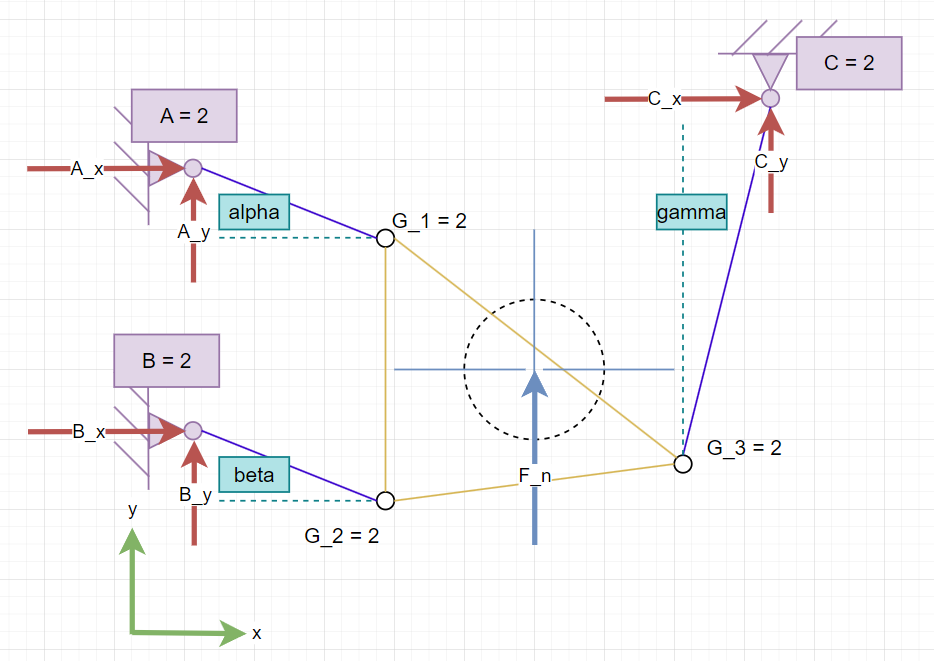

In [340]:
# geometrische Bestimmung

n = 4       # Anzahl Körper
r = 3*2     # Anzahl Reaktionskräfte A,B,C
v = 3*2     # Anzahl der Schnittsgrößen G_1,G_2,G_3

f = 3*n - (r+v)
print(f"f = {f}")

f = 0


In [341]:
# Kräfte resultierend aus Radlast

#Maße aus Achsgeometrie
l_st_o = 0.310          #Länge Strebe oben
l_st_u = 0.278          #Länge Strebe unten
l_zyl_mitte = 0.553     #Länge Zylinder mitte
l_zyl_max = 0.573       #Länge Zylinder ausgefahren
l_zyl_min = 0.533       #Länge Zylinder eingefahren

alpha_max = 3.8         #° Auslenkung von x gegen Uhrzeigersinn
alpha_min = -3.7        #° Auslenkung von x gegen Uhrzeigersinn

beta_max = 4.3          #° Auslenkung von x gegen Uhrzeigersinn
beta_min = -4.1         #° Auslenkung von x gegen Uhrzeigersinn

gamma_max = -10.9            #° Auslenkung von y gegen Uhrzeigersinn
gamma_min = -10.1            #° Auslenkung von y gegen Uhrzeigersinn

F_n_rad = F_n_bel["wert"] / n_raeder    #Berechnung der Radlast

#Berechnung der x und y Maße anhand der Strebenlänge und der Auslenkung
A_l_y = l_st_o * np.sin(np.deg2rad(alpha_max))
A_l_x = l_st_o * np.cos(np.deg2rad(alpha_max))

B_l_y = l_st_u * np.sin(np.deg2rad(alpha_max))
B_l_x = l_st_u * np.cos(np.deg2rad(alpha_max))

C_l_y = l_zyl_min * np.cos(np.deg2rad(alpha_max))
C_l_x = l_zyl_min * np.sin(np.deg2rad(alpha_max))

'''
#Gleichungssystem
A_y + B_y + C_y = 50521                         #Gleichgewichtsbedingung in Y
A_x + B_x + C_x = 0                             #Gleichtgewichtsbedingung in X
-A_y * A_l_y - B_y * B_l_y + C_y * C_l_y = 0    #Momentengleichgewicht linksdrehend
'''


'\n#Gleichungssystem\nA_y + B_y + C_y = 50521                         #Gleichgewichtsbedingung in Y\nA_x + B_x + C_x = 0                             #Gleichtgewichtsbedingung in X\n-A_y * A_l_y - B_y * B_l_y + C_y * C_l_y = 0    #Momentengleichgewicht linksdrehend\n'

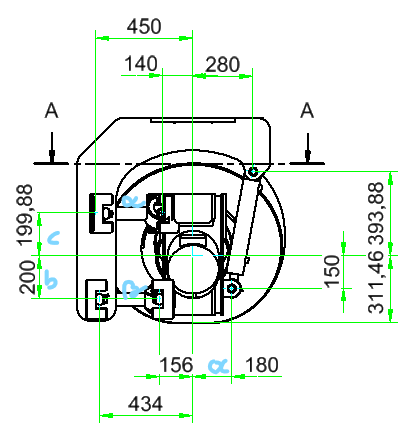

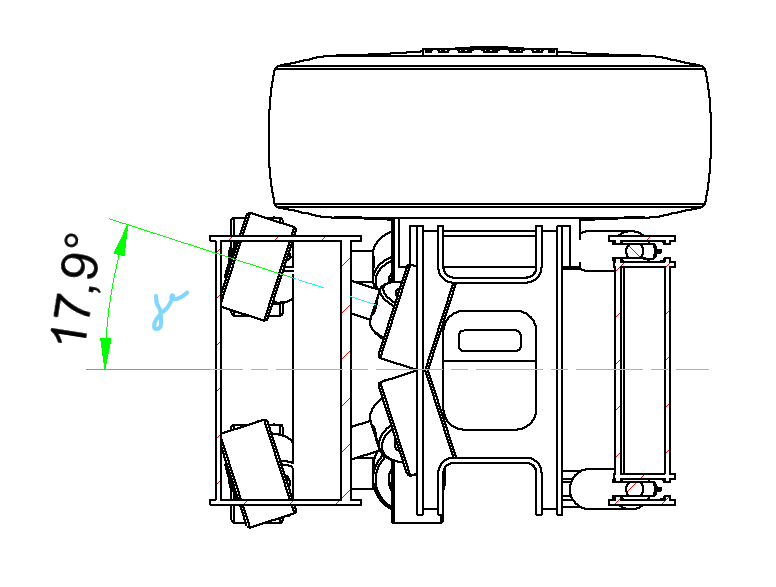

##### 2.16.1.1 Vertikallast infolge Eigengewicht und Nutzlast

In [342]:
def get_df_st (lf_n,F_n,n_raeder, r_rad_bel,F_bb, l_a, l_b, l_c, alpha, beta, gamma):
    #Einzelkräfte
    M_y = (F_n/ n_raeder) * l_a            #Moment aus Zylinder
    F_st_rl = M_y/(l_b+l_c)                         #Kraft Streben aus Radlast
    F_st_br_o = -F_bb+(l_b/(l_b+l_c))               #Kraft Strebe aus Bremskraft
    F_st_br_u = -F_bb+(l_c/(l_b+l_c))               #Kraft Strebe aus Bremskraft
    F_st_rm = -F_bb*r_rad_bel                       #Kraft Strebe aus Radmoment (Bremsmoment)
    F_st_q = 0                                      #Kraft Strebe Querkraft

    #Überlagerung der Kräfte horizontal
    F_st_h_o_max = F_st_rl + F_st_rm - F_st_br_o    #Kraft Strebe horizontal oben max
    F_st_h_o_min = F_st_rl - F_st_rm + F_st_br_o    #Kraft Strebe horizontal oben min
    F_st_h_u_max = -F_st_rl - F_st_rm - F_st_br_u   #Kraft Strebe horizontal unten max
    F_st_h_u_min = -F_st_rl + F_st_rm + F_st_br_u   #Kraft Strebe horizontal unten min

    #resultierende Kräfte
    F_st_dyn_o_max = (F_st_h_o_max/np.cos(np.deg2rad(alpha)))/np.cos(np.deg2rad(gamma))  #Kraft Strebe dynamisch oben max
    F_st_dyn_o_min = (F_st_h_o_min/np.cos(np.deg2rad(alpha)))/np.cos(np.deg2rad(gamma))  #Kraft Strebe dynamisch oben min
    F_st_dyn_u_max = F_st_h_u_max/np.cos(np.deg2rad(beta))                                  #Kraft Strebe dynamisch unten max
    F_st_dyn_u_min = F_st_h_u_min/np.cos(np.deg2rad(beta))                                  #Kraft Strebe dynamisch unten min

    # Ergebnisse in ein DataFrame schreiben
    data = {
        "lastfall": [lf_n],
        "M_y": [M_y],
        "F_st_rl": [F_st_rl],
        "F_st_br_o": [F_st_br_o],
        "F_st_br_u": [F_st_br_u],
        "F_st_rm": [F_st_rm],
        "F_st_q": [F_st_q],
        "F_st_h_o_max": [F_st_h_o_max],
        "F_st_h_o_min": [F_st_h_o_min],
        "F_st_h_u_max": [F_st_h_u_max],
        "F_st_h_u_min": [F_st_h_u_min],
        "F_st_dyn_o_max": [F_st_dyn_o_max],
        "F_st_dyn_o_min": [F_st_dyn_o_min],
        "F_st_dyn_u_max": [F_st_dyn_u_max],
        "F_st_dyn_u_min": [F_st_dyn_u_min]
    }   

    df_zugstreben = pd.DataFrame(data)
    return df_zugstreben

get_df_st(1, F_n_bel["wert"], n_raeder, r_rad_bel["wert"], 0, l_a, l_b, l_c, alpha, beta, gamma)

,lastfall,M_y,F_st_rl,F_st_br_o,F_st_br_u,F_st_rm,F_st_q,F_st_h_o_max,F_st_h_o_min,F_st_h_u_max,F_st_h_u_min,F_st_dyn_o_max,F_st_dyn_o_min,F_st_dyn_u_max,F_st_dyn_u_min
0,1,9093.87,22734.675,0.5,0.5,0.0,0,22734.175,22735.175,-22735.175,-22734.175,23890.614433,23891.665301,-22735.175,-22734.175


##### 2.16.1.3 Längslasten infolge Bremsen

In [343]:
'''
#Einzelkräfte
M_y = (F_n_bel["wert"] / n_raeder) * l_a        #Moment aus Zylinder
F_st_rl_lf3 = M_y/(l_b+l_c)                     #Kraft Streben aus Radlast
F_st_br_o = -F_bb_19296_dyn["wert"]+(l_b/(l_b+l_c)) #Kraft Strebe aus Bremskraft
F_st_br_u = -F_bb_19296_dyn["wert"]+(l_c/(l_b+l_c)) #Kraft Strebe aus Bremskraft
F_st_rm = (-F_bb_19296_dyn["wert"]*r_rad_bel["wert"])
F_st_q = 0                                      #Kraft Strebe Querkraft

#Überlagerung der Kräfte horizontal
F_st_h_o_max = F_st_rl + F_st_rm - F_st_br_o    #Kraft Strebe horizontal oben max
F_st_h_o_min = F_st_rl - F_st_rm + F_st_br_o    #Kraft Strebe horizontal oben min
F_st_h_u_max = -F_st_rl - F_st_rm - F_st_br_u   #Kraft Strebe horizontal unten max
F_st_h_u_min = -F_st_rl + F_st_rm + F_st_br_u   #Kraft Strebe horizontal unten min

#resuliterende Kräfte
F_st_dyn_o_max = (F_st_h_o_lf1_max/np.cos(np.deg2rad(alpha_lf1)))/np.cos(np.deg2rad(gamma_lf1))  #Kraft Strebe dynamisch oben max
F_st_dyn_o_min = (F_st_h_o_lf1_min/np.cos(np.deg2rad(alpha_lf1)))/np.cos(np.deg2rad(gamma_lf1))  #Kraft Strebe dynamisch oben min
F_st_dyn_u_max = F_st_h_u_lf1_max/np.cos(np.deg2rad(beta_lf1))                                  #Kraft Strebe dynamisch unten max
F_st_dyn_u_min = F_st_h_u_lf1_min/np.cos(np.deg2rad(beta_lf1))                                  #Kraft Strebe dynamisch unten min

# Ergebnisse in ein DataFrame schreiben
data = {
    "lastfall": ["lf3"],
    "M_y": [M_y],
    "F_st_rl": [F_st_rl],
    "F_st_br_o": [F_st_br_o],
    "F_st_br_u": [F_st_br_u],
    "F_st_rm": [F_st_rm],
    "F_st_q": [F_st_q],
    "F_st_h_o_max": [F_st_h_o_max],
    "F_st_h_o_min": [F_st_h_o_min],
    "F_st_h_u_max": [F_st_h_u_max],
    "F_st_h_u_min": [F_st_h_u_min],
    "F_st_dyn_o_max": [F_st_dyn_o_max],
    "F_st_dyn_o_min": [F_st_dyn_o_min],
    "F_st_dyn_u_max": [F_st_dyn_u_max],
    "F_st_dyn_u_min": [F_st_dyn_u_min]
}

# Füge die Daten als neue Zeile zum bestehenden DataFrame hinzu
df_zugstreben = pd.concat([df_zugstreben, pd.DataFrame(data)], ignore_index=True)
'''


'\n#Einzelkräfte\nM_y = (F_n_bel["wert"] / n_raeder) * l_a        #Moment aus Zylinder\nF_st_rl_lf3 = M_y/(l_b+l_c)                     #Kraft Streben aus Radlast\nF_st_br_o = -F_bb_19296_dyn["wert"]+(l_b/(l_b+l_c)) #Kraft Strebe aus Bremskraft\nF_st_br_u = -F_bb_19296_dyn["wert"]+(l_c/(l_b+l_c)) #Kraft Strebe aus Bremskraft\nF_st_rm = (-F_bb_19296_dyn["wert"]*r_rad_bel["wert"])\nF_st_q = 0                                      #Kraft Strebe Querkraft\n\n#Überlagerung der Kräfte horizontal\nF_st_h_o_max = F_st_rl + F_st_rm - F_st_br_o    #Kraft Strebe horizontal oben max\nF_st_h_o_min = F_st_rl - F_st_rm + F_st_br_o    #Kraft Strebe horizontal oben min\nF_st_h_u_max = -F_st_rl - F_st_rm - F_st_br_u   #Kraft Strebe horizontal unten max\nF_st_h_u_min = -F_st_rl + F_st_rm + F_st_br_u   #Kraft Strebe horizontal unten min\n\n#resuliterende Kräfte\nF_st_dyn_o_max = (F_st_h_o_lf1_max/np.cos(np.deg2rad(alpha_lf1)))/np.cos(np.deg2rad(gamma_lf1))  #Kraft Strebe dynamisch oben max\nF_st_dyn_o_min 

In [344]:
get_df_st(3, F_n_bel["wert"], n_raeder, r_rad_bel["wert"], F_bb_19296_dyn["wert"], l_a, l_b, l_c, alpha, beta, gamma)

,lastfall,M_y,F_st_rl,F_st_br_o,F_st_br_u,F_st_rm,F_st_q,F_st_h_o_max,F_st_h_o_min,F_st_h_u_max,F_st_h_u_min,F_st_dyn_o_max,F_st_dyn_o_min,F_st_dyn_u_max,F_st_dyn_u_min
0,3,9093.87,22734.675,10104.8,10104.8,3789.1125,0,16418.9875,29050.3625,-36628.5875,-8840.7625,17254.186692,30528.093042,-36628.5875,-8840.7625


### 2.17 elektrisches Laden

In [345]:
# Block nimmt den Energieverbrauch aus dem Lastkolleektiv Batterie und berechnet die Ladezeit anhand der Ladeleistungen

# Ladezeit DC und AC anhand des maximalen kumulierten Energieverbrauchs berechnen
max_energie_kum = df_Batterie_voll_leer["Energie_kum (kWh)"].abs().max()
t_laden_DC = return_var_dict("t_laden_DC", "Ladezeit DC", (max_energie_kum / P_laden_DC) * 60, "min")
t_laden_AC = return_var_dict("t_laden_AC", "Ladezeit AC", (max_energie_kum / P_laden_AC) * 60, "min")

print_res(t_laden_AC)
print_res(t_laden_DC)

Ladezeit AC = 181.89 min
Ladezeit DC = 106.71 min


### 3.0 Daten für Kunde

#### 3.1 Zyklus Kunde

In [346]:
# Füge eine letzte Phase "Laden" an das Ende von df_Batterie_voll_leer an

# Ladezeit und Energiebedarf aus den vorhandenen Variablen
ladezeit = t_laden_DC["wert"]  # Minuten
energie_laden = df_Batterie_voll_leer["Energie_kum (kWh)"].iloc[-1]
start_laden = df_Batterie_voll_leer["Zeit kumuliert (s)"].iloc[-1] / 60  # Minuten
end_laden = start_laden + ladezeit

# Annahme: konstante Ladeleistung (AC)
ladeleistung = P_laden_AC  # kW


# Erzeuge zwei Zeilen für Start und Ende der Ladephase
lade_rows = [
    {
        "Sektor": None,
        "Phase": "Laden",
        "Zeit kumuliert (min)": start_laden,
        "Leistung (kW)": ladeleistung,
        "Energie (kWh)": 0,
        "Energie_kum (kWh)": energie_laden
    },
    {
        "Sektor": None,
        "Phase": "Laden",
        "Zeit kumuliert (min)": end_laden,
        "Leistung (kW)": ladeleistung,
        "Energie (kWh)": energie_laden,
        "Energie_kum (kWh)": 0  # Nach dem Laden ist der Akku wieder voll
    }
]

# DataFrame erweitern (Zeitspalte in min umbenennen und umrechnen)
df_tmp = df_Batterie_voll_leer.copy()
df_tmp["Zeit kumuliert (min)"] = df_tmp["Zeit kumuliert (s)"] / 60

df_Zyklus_Kunde = pd.concat([df_tmp, pd.DataFrame(lade_rows)], ignore_index=True)



C:\Users\nedo\AppData\Local\Temp\ipykernel_18952\4156425540.py:37: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [347]:
#plot für df_zyklus_Kundeimport plotly.graph_objs as go

fig = go.Figure()

# Primärachse: Leistung
fig.add_trace(go.Scatter(
    x=df_Zyklus_Kunde["Zeit kumuliert (min)"],
    y=df_Zyklus_Kunde["Leistung (kW)"],
    mode='lines',
    name="Leistung",
    yaxis="y1"
))

# Sekundärachse: Energie
fig.add_trace(go.Scatter(
    x=df_Zyklus_Kunde["Zeit kumuliert (min)"],
    y=df_Zyklus_Kunde["Energie (kWh)"],
    mode='lines',
    name="Energie",
    yaxis="y2"
))

fig.add_trace(go.Scatter(
    x=df_Zyklus_Kunde["Zeit kumuliert (min)"],
    y=df_Zyklus_Kunde["Energie_kum (kWh)"],
    mode='lines',
    name="Energie kumuliert",
    yaxis="y2"
))

fig.update_layout(
    title="Zyklus Kunde",
    xaxis_title="Zeit kumuliert (min)",
    yaxis=dict(
        title="Leistung (kW)",
        side="left"
    ),
    yaxis2=dict(
        title="Energie (kWh)",
        overlaying="y",
        side="right"
    ),
    hovermode="x unified"
)

# Anzahl der Phasen (ohne Ladephase)
phasenzahl = df_Batterie_voll_leer.shape[0]

# Zeitpunkte für die vertikalen Linien
# Strich bei Hälfte der Phasen (Ende Hinfahrt)
hinfahrt_idx = phasenzahl // 2
hinfahrt_zeit = df_Zyklus_Kunde["Zeit kumuliert (min)"].iloc[hinfahrt_idx]

# Strich nach letzter Phase (Beginn Aufladen)
ladephase_start_zeit = df_Zyklus_Kunde["Zeit kumuliert (min)"].iloc[phasenzahl-1]

# Vertikale Linie für Hinfahrt/Rückfahrt-Trennung
fig.add_vline(
    x=hinfahrt_zeit,
    line_dash="dot",
    line_color="black",
    annotation_text="Ende Hinfahrt",
    annotation_position="bottom right"
)

# Vertikale Linie für Beginn Aufladen
fig.add_vline(
    x=ladephase_start_zeit,
    line_dash="dot",
    line_color="black",
    annotation_text="Beginn Laden",
    annotation_position="bottom right"
)

fig.show()

In [348]:
P_nom = return_var_dict("P_nom","Leistung nominal",df_Zyklus_Kunde["Leistung (kW)"].abs().mean(),"kW")
P_max = return_var_dict("P_nom","Leistung Spitze",df_Zyklus_Kunde["Leistung (kW)"].abs().max(),"kW")
E_kum_voll_voll = return_var_dict("E_kum", "Batteriekapazität aus Profil voll_voll", df_Batterie_voll_voll["Energie_kum (kWh)"].abs().max(),"kWh")
E_kum_voll_leer = return_var_dict("E_kum", "Batteriekapazität aus Profil voll_leer", df_Batterie_voll_leer["Energie_kum (kWh)"].abs().max(),"kWh")
t_fahren = return_var_dict("t_fahren", "Fahrzeit", t_kum["wert"]/60,"min")

E_bat_ges = return_var_dict("E_bat_ges", "Batteriekapazität gesamt Brutto", (E_bat_br*n_bat)/1000, "kWH")
K_bat_ges = return_var_dict("K_bat_ges", "Batteriepreis gesamt", K_bat_kwH * E_bat_ges["wert"], "€")

print_res(P_nom)
print_res(P_max)
print_res(E_kum_voll_voll)
print_res((E_kum_voll_leer))
print_res(t_fahren)
print_res(t_laden_DC)
print_res(t_laden_AC)
print_res(E_bat_ges)
print_res(K_bat_ges)

Leistung nominal = 71.56 kW
Leistung Spitze = 333.79 kW
Batteriekapazität aus Profil voll_voll = 158.34 kWh
Batteriekapazität aus Profil voll_leer = 133.39 kWh
Fahrzeit = 290.70 min
Ladezeit DC = 106.71 min
Ladezeit AC = 181.89 min
Batteriekapazität gesamt Brutto = 62.70 kWH
Batteriepreis gesamt = 28215.00 €
